In [1]:
#pip install wrds

In [2]:
#pip install arch

In [3]:
# Import necessary packages
import wrds
import pandas as pd
import numpy as np
import arch
from sklearn.metrics import mean_squared_error
from tabulate import tabulate
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import statsmodels.api as sm
from statsmodels.stats.diagnostic import acorr_ljungbox

import warnings
warnings.filterwarnings("ignore")

In [4]:
# Connect to the WRDS dataset
conn = wrds.Connection()

Enter your WRDS username [root]:snajafian
Enter your password:··········
WRDS recommends setting up a .pgpass file.
Create .pgpass file now [y/n]?: y
Created .pgpass file successfully.
You can create this file yourself at any time with the create_pgpass_file() function.
Loading library list...
Done


In [5]:
# Define permnos and tickers for targeted etfs and store them in corresponding lists
# 12 ETFs: S&P 500 etf and all of its 11 sectors
permnos_list = [88215, 88225, 88228, 88224, 88296, 88294, 88295, 88298, 88292, 88299, 88291, 88301]
tickers_list = ['ivv', 'iyw', 'iyf', 'iyz', 'iyh', 'iyr', 'iyj', 'iye', 'idu', 'iyk', 'iyc', 'iym']

# Convert the list of permnos and tickers to a format suitable for the SQL query
permnos_str = ', '.join(str(permno) for permno in permnos_list)
tickers_str = ', '.join(str(ticker) for ticker in tickers_list)

In [6]:
# Construct and execute a SQL query to get daily data
daily_query = f"""
        SELECT date, permno, retx
        FROM crsp.dsf
        WHERE permno IN ({permnos_str})
        and date >= '2002-01-01'
        """
daily_df = conn.raw_sql(daily_query)

print(daily_df.shape)
daily_df.head()

(66444, 3)


,date,permno,retx
0,2002-01-02,88291,-0.004854
1,2002-01-03,88291,0.006143
2,2002-01-04,88291,0.010235
3,2002-01-07,88291,0.003377
4,2002-01-08,88291,-0.001772


In [7]:
# Construct and execute a SQL query to get monthly data
monthly_query = f"""
        SELECT date, permno, retx
        FROM crsp.msf
        WHERE permno IN ({permnos_str})
        and date >= '2002-01-01'
        """
monthly_df = conn.raw_sql(monthly_query)

print(monthly_df.shape)
monthly_df.head()

(3168, 3)


,date,permno,retx
0,2002-01-31,88215,-0.010409
1,2002-02-28,88215,-0.018561
2,2002-03-28,88215,0.031070
3,2002-04-30,88215,-0.057123
4,2002-05-31,88215,-0.008059


In [8]:
# Construct and execute a SQL query to get monthly risk-free rate data based on the general yield to maturity
# kytreasnox = 2000001: 1-month rate, kytreasnox = 2000002: 3-month rate
riskfree_query = f"""
        SELECT mcaldt, kytreasnox, tmytm
        FROM crsp.tfz_mth_rf
        WHERE mcaldt >= '2002-01-01' AND kytreasnox = 2000002
        """
riskfree_df = conn.raw_sql(riskfree_query)

print(riskfree_df.shape)
riskfree_df.head()

(264, 3)


,mcaldt,kytreasnox,tmytm
0,2002-01-31,2000002.0,1.757874
1,2002-02-28,2000002.0,1.755328
2,2002-03-28,2000002.0,1.783334
3,2002-04-30,2000002.0,1.750321
4,2002-05-31,2000002.0,1.722193


In [9]:
# Drop unnecessary columns, rename the columns, and change the format of the date column
riskfree_df.drop('kytreasnox', axis = 1, inplace = True)
riskfree_df.columns = ['date','riskfree']
riskfree_df['date'] = pd.to_datetime(riskfree_df['date'])
riskfree_df.set_index('date', inplace = True, drop = True)

In [10]:
# Change the format of the date column
daily_df['date'] = pd.to_datetime(daily_df['date'])
monthly_df['date'] = pd.to_datetime(monthly_df['date'])

# Create the mapping dictionary for PERMNOs to tickers
permno_ticker_mapping = dict(zip(permnos_list, tickers_list))

# Replace the 'permno' column with the corresponding tickers
daily_df['ticker'] = daily_df['permno'].map(permno_ticker_mapping)
monthly_df['ticker'] = monthly_df['permno'].map(permno_ticker_mapping)

# Drop the original 'permno' column
daily_df = daily_df.drop(columns = ['permno'])
monthly_df = monthly_df.drop(columns = ['permno'])

In [11]:
# Pivot the data to put each etf in a separate column
daily_pivot = pd.pivot_table(daily_df, values = 'retx', index = 'date', columns = 'ticker')
daily_pivot.sort_index(inplace = True)

monthly_pivot = pd.pivot_table(monthly_df, values = 'retx', index = 'date', columns = 'ticker')
monthly_pivot.sort_index(inplace = True)

print(tabulate(daily_pivot.head(), headers='keys', tablefmt='pretty', floatfmt=".2f"))
print(tabulate(monthly_pivot.head(), headers='keys', tablefmt='pretty', floatfmt=".2f"))

+---------------------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+
|        date         |    idu    |    ivv    |    iyc    |    iye    |    iyf    |    iyh    |    iyj    |    iyk    |    iym    |    iyr    |    iyw    |    iyz    |
+---------------------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+
| 2002-01-02 00:00:00 | 0.006253  | 0.009796  | -0.004854 | -0.009434 | -0.011057 | -0.006441 | -0.00396  | 0.004358  | -0.004939 | 0.005639  | 0.024436  | 0.015858  |
| 2002-01-03 00:00:00 | -0.006059 |  0.01152  | 0.006143  | -0.006349 |  0.00691  | -0.00859  | -0.001988 | -0.012332 | 0.017241  | 0.003115  | 0.055963  |  0.01124  |
| 2002-01-04 00:00:00 | -0.003907 | 0.007022  | 0.010235  | 0.005751  | 0.012477  | 0.000981  | 0.011552  | -0.001618 | 0.023113  | -0.000124 | 0.007646  | -0.0

In [12]:
# Calculate daily and monthly log returns and store them in new dataframes
daily_return = np.log(1 + daily_pivot) * 100
daily_return.dropna(inplace = True)

monthly_return = np.log(1 + monthly_pivot) * 100
monthly_return.dropna(inplace = True)

print(tabulate(daily_return.head().round(2), headers='keys', tablefmt='pretty', floatfmt=".2f"))
print(tabulate(monthly_return.head().round(2), headers='keys', tablefmt='pretty', floatfmt=".2f"))

+---------------------+-------+-------+-------+-------+-------+-------+-------+-------+-------+-------+-------+-------+
|        date         |  idu  |  ivv  |  iyc  |  iye  |  iyf  |  iyh  |  iyj  |  iyk  |  iym  |  iyr  |  iyw  |  iyz  |
+---------------------+-------+-------+-------+-------+-------+-------+-------+-------+-------+-------+-------+-------+
| 2002-01-02 00:00:00 | 0.62  | 0.97  | -0.49 | -0.95 | -1.11 | -0.65 | -0.4  | 0.43  | -0.5  | 0.56  | 2.41  | 1.57  |
| 2002-01-03 00:00:00 | -0.61 | 1.15  | 0.61  | -0.64 | 0.69  | -0.86 | -0.2  | -1.24 | 1.71  | 0.31  | 5.45  | 1.12  |
| 2002-01-04 00:00:00 | -0.39 |  0.7  | 1.02  | 0.57  | 1.24  |  0.1  | 1.15  | -0.16 | 2.28  | -0.01 | 0.76  | -0.59 |
| 2002-01-07 00:00:00 | 0.42  | -0.76 | 0.34  | 0.38  | -0.43 | -0.67 | -1.21 | -0.95 | -0.5  | -0.26 | -1.46 | -0.78 |
| 2002-01-08 00:00:00 | -1.34 | -0.41 | -0.18 | -0.98 | -1.81 | -0.44 | -0.32 |  0.4  | -1.27 | -0.16 |  0.7  | -1.13 |
+---------------------+-------+-------+-

In [13]:
# Define the split_date for train and test datasets
split_date = pd.Timestamp('2020-01-01')

# Split daily and monthly data into train and test datasets
daily_total = daily_return
daily_train = daily_return.loc[daily_return.index < split_date]
daily_test = daily_return.loc[daily_return.index >= split_date]

monthly_total = monthly_return
monthly_train = monthly_return.loc[monthly_return.index < split_date]
monthly_test = monthly_return.loc[monthly_return.index >= split_date]

In [14]:
# Calculate monthly realized volatility from daily data
realized_vol_train = daily_train.groupby([daily_train.index.year, daily_train.index.month]).std() * np.sqrt(252)
realized_vol_train = realized_vol_train.iloc[1:]

In [15]:
monthly_train.reset_index(drop = True, inplace = True)

In [16]:
# Initialize DataFrames to store RMSE, coefficients, standard errors, p-values, and volatility
rmse_df = pd.DataFrame(columns = monthly_train.columns)

coeff_dict = {}
stderr_dict = {}
pvalue_dict = {}

garch_dict = {}

In [17]:
# Store the index of the last training data in split_index
split_index = len(monthly_train)

In [18]:
# Fit GARCH models and store the parameters
for p in range(1,4): #range(1,12)
  print(p)

  for q in range(1,4): #range(1,12)

    coeff_df = pd.DataFrame()
    stderr_df = pd.DataFrame()
    pvalue_df = pd.DataFrame()

    garch_df = pd.DataFrame(index = monthly_train.index)

    for ticker in monthly_total.columns:
      # Fit the GARCH model on the monthly training data
      garch = arch.arch_model(monthly_total[ticker], mean = 'AR', lags = 1, p = p, q = q)
      res = garch.fit(last_obs = split_index, disp='off')

      # Store coefficients, standard errors, and p-values
      params_model = res.params
      params_model = params_model.rename(index = {params_model.index[1] : "ar"})
      coeff_df[ticker] = params_model

      stderr_model = res.std_err
      stderr_model = stderr_model.rename(index = {stderr_model.index[1] : "ar"})
      stderr_df[ticker] = stderr_model

      pvalues_model = res.pvalues
      pvalues_model = pvalues_model.rename(index = {pvalues_model.index[1] : "ar"})
      pvalue_df[ticker] = pvalues_model

      # In-sample conditional volatility
      in_sample_vol = res.conditional_volatility
      in_sample_vol = in_sample_vol.iloc[:split_index]

      # Calculate in-sample RMSE
      rmse_df.loc[str((p,q)), ticker] = mean_squared_error(realized_vol_train[ticker].iloc[:], in_sample_vol.iloc[1:], squared=False)

      # Add to DataFrame
      garch_df[ticker] = in_sample_vol.values

    coeff_dict[(p,q)] = coeff_df
    stderr_dict[(p,q)] = stderr_df
    pvalue_dict[(p,q)] = pvalue_df

    garch_dict[(p,q)] = garch_df

1
2
3


In [19]:
# Change the format of columns to float
for column in rmse_df.columns:
  rmse_df[column] = rmse_df[column].astype('float')

In [20]:
# Calculate the average RMSE of each GARCH model and sort the RMSE DataFrame by the mean RMSE
rmse_df['mean'] = rmse_df.mean(axis = 1)
rmse_df.sort_values('mean').head(10).round(4)

ticker,idu,ivv,iyc,iye,iyf,iyh,iyj,iyk,iym,iyr,iyw,iyz,mean
"(2, 1)",14.0679,14.6069,14.6577,21.7132,21.5325,13.4862,15.7383,11.7404,19.5329,22.3943,17.4152,17.1975,17.0069
"(1, 2)",14.0440,14.6450,14.6704,21.7177,21.5055,13.4827,15.7283,11.7321,19.5043,22.3989,17.4319,17.2303,17.0076
"(1, 1)",14.0440,14.6449,14.6704,21.7177,21.5054,13.4863,15.7282,11.7321,19.5044,22.3962,17.4319,17.2303,17.0077
"(2, 3)",14.0892,14.6061,14.6523,21.7133,21.5328,13.4924,15.7381,11.7328,19.5713,22.4052,17.4016,17.1819,17.0098
"(1, 3)",14.0439,14.6450,14.6703,21.7177,21.5054,13.4992,15.7283,11.7790,19.4777,22.4056,17.4319,17.2302,17.0112
"(3, 3)",14.0795,14.6058,14.6528,21.7132,21.5328,13.4803,15.7727,11.7841,19.5712,22.4193,17.3819,17.1832,17.0147
"(2, 2)",14.0893,14.6061,14.6491,21.7132,21.5330,13.4819,15.7384,11.7327,19.6005,22.4554,17.4152,17.1951,17.0175
"(3, 1)",14.0617,14.6069,14.6576,21.7154,21.5939,13.4689,15.7728,11.7841,19.5330,22.4669,17.4153,17.1975,17.0228
"(3, 2)",14.0795,14.6062,14.6493,21.7139,21.5328,13.4688,15.7725,11.7842,19.6005,22.4669,17.4063,17.1951,17.0230


In [21]:
pvalue_dict[(1,1)].round(4)

,idu,ivv,iyc,iye,iyf,iyh,iyj,iyk,iym,iyr,iyw,iyz
Const,0.0033,0.0001,0.0010,0.1867,0.0025,0.0059,0.0009,0.0124,0.0006,0.0976,0.0005,0.0669
ar,0.5178,0.3153,0.5172,0.5720,0.8678,0.7962,0.2926,0.9546,0.1298,0.2473,0.2319,0.4027
omega,0.0145,0.0334,0.0167,0.0603,0.0839,0.1378,0.0145,0.0300,0.0837,0.2611,0.0309,0.0137
alpha[1],0.0951,0.0009,0.0180,0.1511,0.0014,0.0371,0.0017,0.1236,0.0318,0.0719,0.0076,0.0087
beta[1],0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0002,0.0000,0.0000,0.0000


In [22]:
pvalue_dict[(1,1)].mean(axis = 1)

Const       0.031536
ar          0.487101
omega       0.065043
alpha[1]    0.045736
beta[1]     0.000019
dtype: float64

In [23]:
stderr_dict[(1,1)].mean(axis = 1)

Const       0.293058
ar          0.076449
omega       1.396207
alpha[1]    0.087721
beta[1]     0.085799
dtype: float64

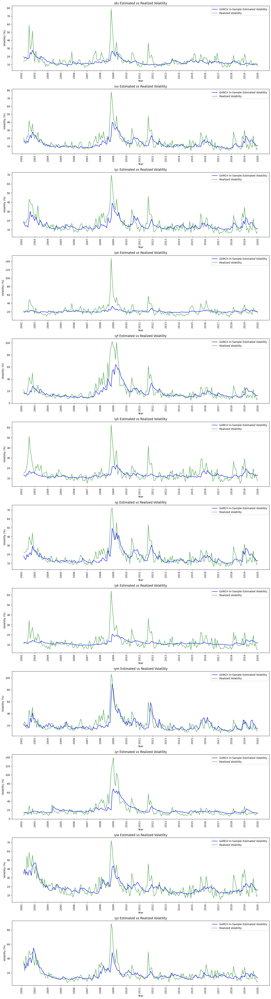

In [24]:
# Plot the realized volatility and calculated GARCH volatility for each etf
garch_df = garch_dict[(1,1)]
garch_df.index = in_sample_vol.index
garch_df = garch_df * np.sqrt(12)
realized_vol_train.index = in_sample_vol.index[1:]

etfs = daily_pivot.columns

fig, axs = plt.subplots(12, 1, figsize = (15, 55))

for i, etf in enumerate(etfs):
    #Determine the ith subplot
    ax = axs[i]

    #Plotting code
    ax.plot(garch_df.index, garch_df[etf], label= 'GARCH In-Sample Estimated Volatility', color='blue')
    ax.plot(realized_vol_train.index, realized_vol_train[etf], label='Realized Volatility', alpha=0.7, color='green')

    #ax.axvline(split_date, color='red', linestyle='--')

    ax.set_title(f'{etf} Estimated vs Realized Volatility')
    ax.set_xlabel('Year')
    ax.set_ylabel('Volatility (%)')
    ax.legend()

    locator = mdates.YearLocator()
    formatter = mdates.DateFormatter('%Y')
    ax.xaxis.set_major_locator(locator)
    ax.xaxis.set_major_formatter(formatter)

    ax.tick_params(axis='x', rotation = 90)

#Adjust layout to prevent overlap
plt.tight_layout()

#Display the plots
plt.show()

In [25]:
print(tabulate(garch_dict[(1,1)].head().round(2), headers='keys', tablefmt='pretty'))

+---------------------+------+------+------+------+------+------+------+------+------+------+-------+-------+
|        date         | idu  | ivv  | iyc  | iye  | iyf  | iyh  | iyj  | iyk  | iym  | iyr  |  iyw  |  iyz  |
+---------------------+------+------+------+------+------+------+------+------+------+------+-------+-------+
| 2002-01-31 00:00:00 | nan  | nan  | nan  | nan  | nan  | nan  | nan  | nan  | nan  | nan  |  nan  |  nan  |
| 2002-02-28 00:00:00 | 5.63 | 4.83 | 5.33 | 5.62 | 5.03 | 3.88 | 5.22 | 3.57 | 6.46 | 4.2  | 9.95  | 9.51  |
| 2002-03-28 00:00:00 | 5.16 | 4.36 | 4.47 | 5.55 | 4.47 | 3.65 | 4.52 | 3.55 | 5.87 | 4.02 | 11.44 | 9.01  |
| 2002-04-30 00:00:00 | 5.52 | 3.89 | 3.98 | 5.84 | 4.68 | 3.44 | 4.07 | 3.53 | 5.24 | 4.22 | 10.03 |  7.6  |
| 2002-05-31 00:00:00 | 5.03 | 4.76 | 4.21 | 5.78 | 4.31 | 4.18 | 5.72 | 3.39 | 6.16 | 3.99 | 10.59 | 10.05 |
+---------------------+------+------+------+------+------+------+------+------+------+------+-------+-------+


**Model 1: Predict the volatility of ETFs using the volatility of S&P 500 ETF (IVV)**

$$\sigma^{ETF}_{t} = \alpha^{ETF} + \beta^{ETF}\sigma^{S\&P500}_{t} + \varepsilon^{ETF}_{t}$$

In [26]:
# Part 1: GARCH
# Create DataFrames to store regression results
garch_coeffs = pd.DataFrame()
garch_residuals = pd.DataFrame()
garch_rsquared = pd.DataFrame()
garch_pvalues = pd.DataFrame()
garch_tstatistics = pd.DataFrame()
garch_fstatistics = pd.DataFrame()
garch_fpvalues = pd.DataFrame()
garch_box_pierce_stats = pd.DataFrame()
garch_box_pierce_pvalues = pd.DataFrame()

# Loop through each ETF
for column in garch_df.columns.drop('ivv'):

    y = garch_df[column]
    y = y[1:]
    X = garch_df['ivv']
    X = X[1:]

    # Add constant to the predictor variable matrix
    X = sm.add_constant(X)

    # Perform OLS regression
    model = sm.OLS(y, X).fit()

    # Store regression results
    garch_coeffs[column] = model.params.values
    garch_residuals[column] = model.resid
    garch_rsquared[column] = [model.rsquared]
    garch_pvalues[column] = model.pvalues.values
    garch_tstatistics[column] = model.tvalues.values
    garch_fstatistics[column] = [model.fvalue]
    garch_fpvalues[column] = [model.f_pvalue]

    # Perform the Box-Pierce test on the residuals
    box_pierce_result = acorr_ljungbox(model.resid, lags=[12], boxpierce=True)
    bp_stat = box_pierce_result.iloc[:, 0]
    bp_pvalue = box_pierce_result.iloc[:, 1]
    garch_box_pierce_stats[column] = bp_stat.values
    garch_box_pierce_pvalues[column] = bp_pvalue.values

In [27]:
print("GARCH coefficients:")
print(tabulate(garch_coeffs.round(3), headers='keys', tablefmt='pretty'))

print("GARCH coefficients p-values:")
print(tabulate(garch_pvalues.round(3), headers='keys', tablefmt='pretty'))

print("GARCH coefficients t-statistics:")
print(tabulate(garch_tstatistics.round(1), headers='keys', tablefmt='pretty'))

print("GARCH f-statistics:")
print(tabulate(garch_fstatistics.round(1), headers='keys', tablefmt='pretty'))

print("GARCH f-statistics p-values:")
print(tabulate(garch_fpvalues.round(2), headers='keys', tablefmt='pretty'))

print("GARCH Box-Pierce test statistics:")
print(tabulate(garch_box_pierce_stats.round(1), headers='keys', tablefmt='pretty'))

print("GARCH Box-Pierce test p-values:")
print(tabulate(garch_box_pierce_pvalues.round(3), headers='keys', tablefmt='pretty'))

GARCH coefficients:
+---+-------+-------+--------+--------+-------+-------+-------+-------+-------+-------+-------+
|   |  idu  |  iyc  |  iye   |  iyf   |  iyh  |  iyj  |  iyk  |  iym  |  iyr  |  iyw  |  iyz  |
+---+-------+-------+--------+--------+-------+-------+-------+-------+-------+-------+-------+
| 0 | 7.492 | 4.751 | 16.952 | -2.928 |  8.4  |  1.3  | 7.767 | -0.5  | 3.131 | 5.893 | 4.668 |
| 1 | 0.435 | 0.76  | 0.287  | 1.541  | 0.344 | 1.128 | 0.31  | 1.618 | 1.242 | 0.997 | 0.964 |
+---+-------+-------+--------+--------+-------+-------+-------+-------+-------+-------+-------+
GARCH coefficients p-values:
+---+-----+-----+-----+-----+-----+-----+-----+-------+------+-----+-----+
|   | idu | iyc | iye | iyf | iyh | iyj | iyk |  iym  | iyr  | iyw | iyz |
+---+-----+-----+-----+-----+-----+-----+-----+-------+------+-----+-----+
| 0 | 0.0 | 0.0 | 0.0 | 0.0 | 0.0 | 0.0 | 0.0 | 0.604 | 0.01 | 0.0 | 0.0 |
| 1 | 0.0 | 0.0 | 0.0 | 0.0 | 0.0 | 0.0 | 0.0 |  0.0  | 0.0  | 0.0 | 0.0 |


In [28]:
# Part 2: Realized volatility
# Create DataFrames to store regression results
rv_coeffs = pd.DataFrame()
rv_residuals = pd.DataFrame()
rv_rsquared = pd.DataFrame()
rv_pvalues = pd.DataFrame()
rv_tstatistics = pd.DataFrame()
rv_fstatistics = pd.DataFrame()
rv_fpvalues = pd.DataFrame()
rv_box_pierce_stats = pd.DataFrame()
rv_box_pierce_pvalues = pd.DataFrame()

# Loop through each ETF
for column in realized_vol_train.columns.drop('ivv'):

    y = realized_vol_train[column]
    X = realized_vol_train['ivv']

    # Add constant to the predictor variable matrix
    X = sm.add_constant(X)

    # Perform OLS regression
    model = sm.OLS(y, X).fit()

    # Store regression results
    rv_coeffs[column] = model.params.values
    rv_residuals[column] = model.resid
    rv_rsquared[column] = [model.rsquared]
    rv_pvalues[column] = model.pvalues.values
    rv_tstatistics[column] = model.tvalues.values
    rv_fstatistics[column] = [model.fvalue]
    rv_fpvalues[column] = [model.f_pvalue]

    # Perform the Box-Pierce test on the residuals
    box_pierce_result = acorr_ljungbox(model.resid, lags=[12], boxpierce=True)
    bp_stat = box_pierce_result.iloc[:, 0]
    bp_pvalue = box_pierce_result.iloc[:, 1]
    rv_box_pierce_stats[column] = bp_stat.values
    rv_box_pierce_pvalues[column] = bp_pvalue.values

In [29]:
print("RV coefficients:")
print(tabulate(rv_coeffs.round(3), headers='keys', tablefmt='pretty'))

print("RV coefficients p-values:")
print(tabulate(rv_pvalues.round(3), headers='keys', tablefmt='pretty'))

print("RV coefficients t-statistics:")
print(tabulate(rv_tstatistics.round(1), headers='keys', tablefmt='pretty'))

print("RV f-statistics:")
print(tabulate(rv_fstatistics.round(1), headers='keys', tablefmt='pretty'))

print("RV f-statistics p-values:")
print(tabulate(rv_fpvalues.round(2), headers='keys', tablefmt='pretty'))

print("RV Box-Pierce test statistics:")
print(tabulate(rv_box_pierce_stats.round(1), headers='keys', tablefmt='pretty'))

print("RV Box-Pierce test p-values:")
print(tabulate(rv_box_pierce_pvalues.round(3), headers='keys', tablefmt='pretty'))

RV coefficients:
+---+-------+-------+-------+--------+-------+-------+-------+-------+--------+-------+-------+
|   |  idu  |  iyc  |  iye  |  iyf   |  iyh  |  iyj  |  iyk  |  iym  |  iyr   |  iyw  |  iyz  |
+---+-------+-------+-------+--------+-------+-------+-------+-------+--------+-------+-------+
| 0 | 3.624 | 2.132 | 4.694 | -3.639 | 4.339 | 2.136 | 2.331 | 2.805 | -2.577 | 4.968 | 3.016 |
| 1 | 0.752 | 0.913 | 1.197 | 1.559  | 0.691 | 1.005 | 0.686 | 1.255 | 1.501  | 0.981 | 1.042 |
+---+-------+-------+-------+--------+-------+-------+-------+-------+--------+-------+-------+
RV coefficients p-values:
+---+-----+-----+-----+-----+-----+-----+-----+-----+-------+-----+-----+
|   | idu | iyc | iye | iyf | iyh | iyj | iyk | iym |  iyr  | iyw | iyz |
+---+-----+-----+-----+-----+-----+-----+-----+-----+-------+-----+-----+
| 0 | 0.0 | 0.0 | 0.0 | 0.0 | 0.0 | 0.0 | 0.0 | 0.0 | 0.073 | 0.0 | 0.0 |
| 1 | 0.0 | 0.0 | 0.0 | 0.0 | 0.0 | 0.0 | 0.0 | 0.0 |  0.0  | 0.0 | 0.0 |
+---+-----+

**Predict the volatility of ETFs using the parameters obtained from the previous part regressions**

$$\hat{\sigma}^{ETF}_{t} = \hat{\alpha}^{ETF} + \hat{\beta}^{ETF}\sigma^{S\&P500}_{t}$$

In [30]:
# GARCH
garch_pred = pd.DataFrame()

for column in garch_coeffs.columns:
  garch_pred[column] = garch_coeffs.loc[0, column] + garch_coeffs.loc[1, column] * garch_df['ivv']

# Realized volatility
rv_pred = pd.DataFrame()

for column in rv_coeffs.columns:
  rv_pred[column] = rv_coeffs.loc[0, column] + rv_coeffs.loc[1, column] * realized_vol_train['ivv']

**Calculate the weight of ETFs in the portfolio and normalize them**

$$W^{ETF}_{t} = \frac{\bar{\mu_{0,t}}}{\hat{\sigma}^{ETF}_{t}}$$

In [31]:
# Create a new DataFrame with monthly cumulative means
monthly_cum_mean = monthly_train.expanding().mean()

monthly_cum_mean.index = garch_pred.index

In [32]:
# Calculate the weight of ETFs in the garch portfolio (weight = mu / sigma)
garch_weight = pd.DataFrame()

for column in garch_pred.columns:
  garch_weight[column] = monthly_cum_mean[column] / garch_pred[column]

numerator = garch_weight.sub(garch_weight.min(axis = 1), axis=0)
denominator = garch_weight.max(axis = 1) - garch_weight.min(axis = 1)
garch_normal_weight = numerator.div(denominator, axis=0)
garch_normal_weight = garch_normal_weight.div(garch_normal_weight.sum(axis = 1), axis=0)

# Calculate the weight of ETFs in the realized volatility portfolio (weight = mu / sigma)
rv_weight = pd.DataFrame()

for column in rv_pred.columns:
  rv_weight[column] = monthly_cum_mean[column] / rv_pred[column]

numerator = rv_weight.sub(rv_weight.min(axis = 1), axis=0)
denominator = rv_weight.max(axis = 1) - rv_weight.min(axis = 1)
rv_normal_weight = numerator.div(denominator, axis=0)
rv_normal_weight = rv_normal_weight.div(rv_normal_weight.sum(axis = 1), axis=0)

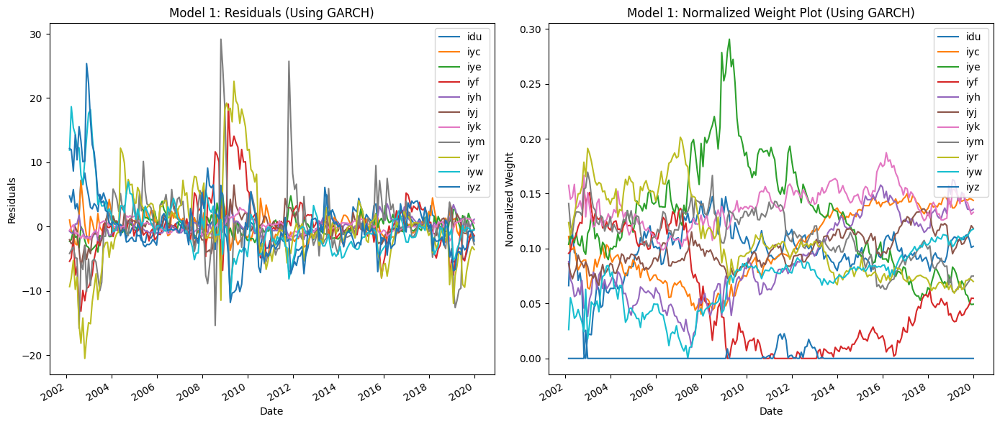

In [33]:
# Plot residuals and weights (Using GARCH)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# Plot ETFs residuals on the first subplot
garch_residuals.plot(kind='line', ax=ax1, title='Model 1: Residuals (Using GARCH)')
ax1.set_xlabel('Date')
ax1.set_ylabel('Residuals')

# Plot ETFs weights on the second subplot
garch_normal_weight.plot(kind='line', ax=ax2, title='Model 1: Normalized Weight Plot (Using GARCH)')
ax2.set_xlabel('Date')
ax2.set_ylabel('Normalized Weight')

fig.tight_layout()
plt.show()

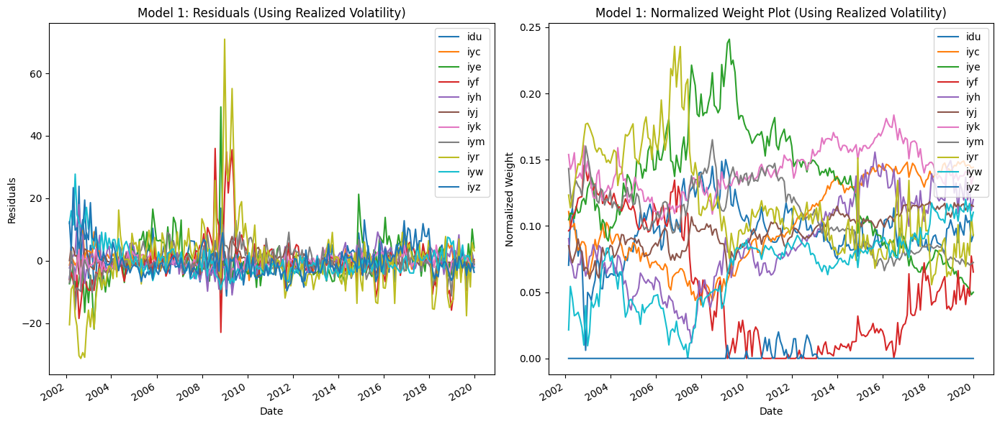

In [34]:
# Plot residuals and weights (Using realized volatility)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# Plot ETFs residuals on the first subplot
rv_residuals.plot(kind='line', ax=ax1, title='Model 1: Residuals (Using Realized Volatility)')
ax1.set_xlabel('Date')
ax1.set_ylabel('Residuals')

# Plot ETFs weights on the second subplot
rv_normal_weight.plot(kind='line', ax=ax2, title='Model 1: Normalized Weight Plot (Using Realized Volatility)')
ax2.set_xlabel('Date')
ax2.set_ylabel('Normalized Weight')

fig.tight_layout()
plt.show()

Compare the Sharpe ratio, Information ratio, CER, turnover, and CRRA of the following portfolios:
*   Value weighted portfolio (IVV ETF)
*   Equal weighted portfolio
*   Constant volatility portfolio
*   GARCH portfolio
*   Realized volatility portfolio

In [35]:
monthly_total = monthly_return
monthly_train = monthly_return.loc[monthly_return.index < split_date]

In [36]:
# Create a new DataFrame for constant volatility
monthly_cv_std = monthly_train.drop('ivv', axis = 1).expanding().std()

# Calculate the weight of ETFs in the constant volatility portfolio (weight = mu / sigma)
cv_weight = pd.DataFrame()

for column in monthly_cv_std.columns:
  cv_weight[column] = monthly_cum_mean[column] / monthly_cv_std[column]

numerator = cv_weight.sub(cv_weight.min(axis = 1), axis = 0)
denominator = cv_weight.max(axis = 1) - cv_weight.min(axis = 1)
cv_normal_weight = numerator.div(denominator, axis=0)
cv_normal_weight = cv_normal_weight.div(cv_normal_weight.sum(axis = 1), axis = 0)

In [37]:
# Calculate equal-weighted portfolio return
ew_portfolio_return = (1 / 11) * monthly_train.drop('ivv', axis = 1)
ew_portfolio_return['portfolio'] = ew_portfolio_return.sum(axis = 1)

print('Equal-weighted portfolio returns:')
print(tabulate(ew_portfolio_return.head().round(4), headers='keys', tablefmt='pretty'))

# Calculate constant volatility portfolio return
cv_portfolio_return = cv_normal_weight.shift(1) * monthly_train.drop('ivv', axis = 1)
cv_portfolio_return['portfolio'] = cv_portfolio_return.sum(axis = 1)

print('Constant volatility portfolio returns:')
print(tabulate(cv_portfolio_return.head().round(4), headers='keys', tablefmt='pretty'))

# Calculate garch portfolio return
garch_portfolio_return = garch_normal_weight.shift(1) * monthly_train.drop('ivv', axis = 1)
garch_portfolio_return['portfolio'] = garch_portfolio_return.sum(axis = 1)

print('GARCH portfolio returns:')
print(tabulate(garch_portfolio_return.head().round(4), headers='keys', tablefmt='pretty'))

# Calculate realized volatility portfolio return
rv_portfolio_return = rv_normal_weight.shift(1) * monthly_train.drop('ivv', axis = 1)
rv_portfolio_return['portfolio'] = rv_portfolio_return.sum(axis = 1)

print('Realized volatility portfolio returns:')
print(tabulate(rv_portfolio_return.head().round(4), headers='keys', tablefmt='pretty'))

Equal-weighted portfolio returns:
+---------------------+---------+---------+---------+---------+---------+---------+--------+---------+--------+---------+---------+-----------+
|        date         |   idu   |   iyc   |   iye   |   iyf   |   iyh   |   iyj   |  iyk   |   iym   |  iyr   |   iyw   |   iyz   | portfolio |
+---------------------+---------+---------+---------+---------+---------+---------+--------+---------+--------+---------+---------+-----------+
| 2002-01-31 00:00:00 | -0.3654 | -0.0854 | -0.5095 | -0.1941 | -0.2088 | -0.4975 | 0.0354 | 0.0236  | 0.0102 |  0.085  | -0.9026 |  -2.609   |
| 2002-02-28 00:00:00 | -0.1041 | 0.0707  | 0.3829  | -0.0683 | -0.027  | 0.1359  | 0.3704 | 0.5043  | 0.178  | -1.4268 | -0.7118 |  -0.6959  |
| 2002-03-28 00:00:00 | 0.7879  | 0.2455  | 0.7009  | 0.5196  | 0.0509  |  0.222  | 0.3539 | 0.3628  | 0.407  | 0.6956  | -0.0691 |   4.277   |
| 2002-04-30 00:00:00 | -0.0966 | -0.3476 | -0.3856 | -0.164  | -0.6165 | -0.7403 | 0.1125 | -0.5521 |

In [38]:
# Create a new dataframe to store the return of portfolios
portfolios_return_df = pd.DataFrame({'vw':monthly_train['ivv'],
                                     'ew':ew_portfolio_return['portfolio'],
                                     'cv':cv_portfolio_return['portfolio'],
                                     'garch':garch_portfolio_return['portfolio'],
                                     'rv':rv_portfolio_return['portfolio']})

# Calculate the total return of all portfolios
print(f"Value-weighted portfolio total return: {portfolios_return_df.loc['2002-04-30':,'vw'].sum().round(2)}")
print(f"Equal-weighted portfolio total return: {portfolios_return_df.loc['2002-04-30':,'ew'].sum().round(2)}")
print(f"Constant Volatility portfolio total return: {portfolios_return_df.loc['2002-04-30':,'cv'].sum().round(2)}")
print(f"GARCH portfolio total return: {portfolios_return_df.loc['2002-04-30':,'garch'].sum().round(2)}")
print(f"Realized Volatility portfolio total return: {portfolios_return_df.loc['2002-04-30':,'rv'].sum().round(2)}")

Value-weighted portfolio total return: 103.79
Equal-weighted portfolio total return: 93.09
Constant Volatility portfolio total return: 94.73
GARCH portfolio total return: 94.59
Realized Volatility portfolio total return: 93.75


In [39]:
riskfree_subset = riskfree_df.loc[portfolios_return_df.index.min():portfolios_return_df.index.max()]

# Calculate the Sharpe ratio of portfolios
sr_df = portfolios_return_df.sub(riskfree_subset['riskfree'] / 12, axis = 0)

print(f"Value-weighted portfolio annual Sharpe ratio = {round(sr_df['vw'].mean()/portfolios_return_df['vw'].std() * np.sqrt(12), 4)}")
print(f"Equal-weighted portfolio annual Sharpe ratio = {round(sr_df['ew'].mean()/portfolios_return_df['ew'].std() * np.sqrt(12), 4)}")
print(f"Constant Volatility portfolio annual Sharpe ratio = {round(sr_df['cv'].mean()/portfolios_return_df['cv'].std() * np.sqrt(12), 4)}")
print(f"GARCH portfolio annual Sharpe ratio = {round(sr_df['garch'].mean()/portfolios_return_df['garch'].std() * np.sqrt(12), 4)}")
print(f"Realized Volatility portfolio annual Sharpe ratio = {round(sr_df['rv'].mean()/portfolios_return_df['rv'].std() * np.sqrt(12), 4)}")

print()
# Calculate the information ratio of portfolios
ir_df = portfolios_return_df.sub(monthly_train['ivv'], axis = 0)

print(f"Value-weighted portfolio annual information ratio = {round(ir_df['vw'].mean()/ir_df['vw'].std() * np.sqrt(12), 4)}")
print(f"Equal-weighted portfolio annual information ratio = {round(ir_df['ew'].mean()/ir_df['ew'].std() * np.sqrt(12), 4)}")
print(f"Constant Volatility portfolio annual information ratio = {round(ir_df['cv'].mean()/ir_df['cv'].std() * np.sqrt(12), 4)}")
print(f"GARCH portfolio annual information ratio = {round(ir_df['garch'].mean()/ir_df['garch'].std() * np.sqrt(12), 4)}")
print(f"Realized Volatility portfolio annual information ratio = {round(ir_df['rv'].mean()/ir_df['rv'].std() * np.sqrt(12), 4)}")

print()
#Calculate the certainty equivalent return (CER) of portfolios
risk_aversion_coeff = 5

print(f"Value-weighted portfolio annual certainty equivalent return (CER) = {round((portfolios_return_df['vw'].mean() - 0.5 * risk_aversion_coeff * portfolios_return_df['vw'].var()/100) * 12 / 100, 4)}")
print(f"Equal-weighted portfolio annual certainty equivalent return (CER) = {round((portfolios_return_df['ew'].mean() - 0.5 * risk_aversion_coeff * portfolios_return_df['ew'].var()/100) * 12 / 100, 4)}")
print(f"Constant Volatility portfolio annual certainty equivalent return (CER) = {round((portfolios_return_df['cv'].mean() - 0.5 * risk_aversion_coeff * portfolios_return_df['cv'].var()/100) * 12 / 100, 4)}")
print(f"GARCH portfolio annual certainty equivalent return (CER) = {round((portfolios_return_df['garch'].mean() - 0.5 * risk_aversion_coeff * portfolios_return_df['garch'].var()/100) * 12 / 100, 4)}")
print(f"Realized Volatility portfolio annual certainty equivalent return (CER) = {round((portfolios_return_df['rv'].mean() - 0.5 * risk_aversion_coeff * portfolios_return_df['rv'].var()/100) * 12 / 100, 4)}")


Value-weighted portfolio annual Sharpe ratio = 0.3165
Equal-weighted portfolio annual Sharpe ratio = 0.27
Constant Volatility portfolio annual Sharpe ratio = 0.2942
GARCH portfolio annual Sharpe ratio = 0.294
Realized Volatility portfolio annual Sharpe ratio = 0.2906

Value-weighted portfolio annual information ratio = nan
Equal-weighted portfolio annual information ratio = -0.2016
Constant Volatility portfolio annual information ratio = -0.0639
GARCH portfolio annual information ratio = -0.0757
Realized Volatility portfolio annual information ratio = -0.0866

Value-weighted portfolio annual certainty equivalent return (CER) = 0.008
Equal-weighted portfolio annual certainty equivalent return (CER) = -0.0003
Constant Volatility portfolio annual certainty equivalent return (CER) = 0.004
GARCH portfolio annual certainty equivalent return (CER) = 0.0042
Realized Volatility portfolio annual certainty equivalent return (CER) = 0.0037


In [40]:
# Calculate equal-weighted portfolio turnover
ew_normal_weight = pd.DataFrame(0.1, index = garch_normal_weight.index, columns = garch_normal_weight.columns)
ew_turnover_df = ew_normal_weight.shift(1) * np.exp(monthly_train.drop('ivv', axis = 1) / 100)

numerator = ew_turnover_df.sub(ew_turnover_df.min(axis = 1), axis = 0)
denominator = ew_turnover_df.max(axis = 1) - ew_turnover_df.min(axis = 1)
ew_turnover_df = numerator.div(denominator, axis = 0)
ew_turnover_df = ew_turnover_df.div(ew_turnover_df.sum(axis = 1), axis=0)

ew_turnover_df = ew_turnover_df - ew_normal_weight.shift(1)
ew_turnover_df['turnover'] = ew_turnover_df.abs().sum(axis = 1) / 2

# Calculate constant volatility portfolio turnover
cv_turnover_df = cv_normal_weight.shift(1) * np.exp(monthly_train.drop('ivv', axis = 1) / 100)

numerator = cv_turnover_df.sub(cv_turnover_df.min(axis = 1), axis = 0)
denominator = cv_turnover_df.max(axis = 1) - cv_turnover_df.min(axis = 1)
cv_turnover_df = numerator.div(denominator, axis = 0)
cv_turnover_df = cv_turnover_df.div(cv_turnover_df.sum(axis = 1), axis=0)

cv_turnover_df = cv_turnover_df - cv_normal_weight.shift(1)
cv_turnover_df['turnover'] = cv_turnover_df.abs().sum(axis = 1) / 2

# Calculate GARCH portfolio turnover
garch_turnover_df = garch_normal_weight.shift(1) * np.exp(monthly_train.drop('ivv', axis = 1) / 100)

numerator = garch_turnover_df.sub(garch_turnover_df.min(axis = 1), axis = 0)
denominator = garch_turnover_df.max(axis = 1) - garch_turnover_df.min(axis = 1)
garch_turnover_df = numerator.div(denominator, axis = 0)
garch_turnover_df = garch_turnover_df.div(garch_turnover_df.sum(axis = 1), axis=0)

garch_turnover_df = garch_turnover_df - garch_normal_weight.shift(1)
garch_turnover_df['turnover'] = garch_turnover_df.abs().sum(axis = 1) / 2

# Calculate realized volatility portfolio turnover
rv_turnover_df = rv_normal_weight.shift(1) * np.exp(monthly_train.drop('ivv', axis = 1) / 100)

numerator = rv_turnover_df.sub(rv_turnover_df.min(axis = 1), axis = 0)
denominator = rv_turnover_df.max(axis = 1) - rv_turnover_df.min(axis = 1)
rv_turnover_df = numerator.div(denominator, axis = 0)
rv_turnover_df = rv_turnover_df.div(rv_turnover_df.sum(axis = 1), axis=0)

rv_turnover_df = rv_turnover_df - rv_normal_weight.shift(1)
rv_turnover_df['turnover'] = rv_turnover_df.abs().sum(axis = 1) / 2

# Create a new dataframe to store the turnover of portfolios
turnover_df = pd.DataFrame({'ew':ew_turnover_df['turnover'],
                            'cv':cv_turnover_df['turnover'],
                            'garch':garch_turnover_df['turnover'],
                            'rv':rv_turnover_df['turnover'],
                            })

print(f"Equal-weighted portfolio average annual turnover: {round(turnover_df['ew'].mean() * 12, 4)}")
print(f"Constant volatility portfolio average annual turnover: {round(turnover_df['cv'].mean() * 12, 4)}")
print(f"GARCH portfolio average annual turnover: {round(turnover_df['garch'].mean() * 12, 4)}")
print(f"Realized volatility portfolio average annual turnover: {round(turnover_df['rv'].mean() * 12, 4)}")

Equal-weighted portfolio average annual turnover: 2.9824
Constant volatility portfolio average annual turnover: 0.1365
GARCH portfolio average annual turnover: 0.1341
Realized volatility portfolio average annual turnover: 0.1348


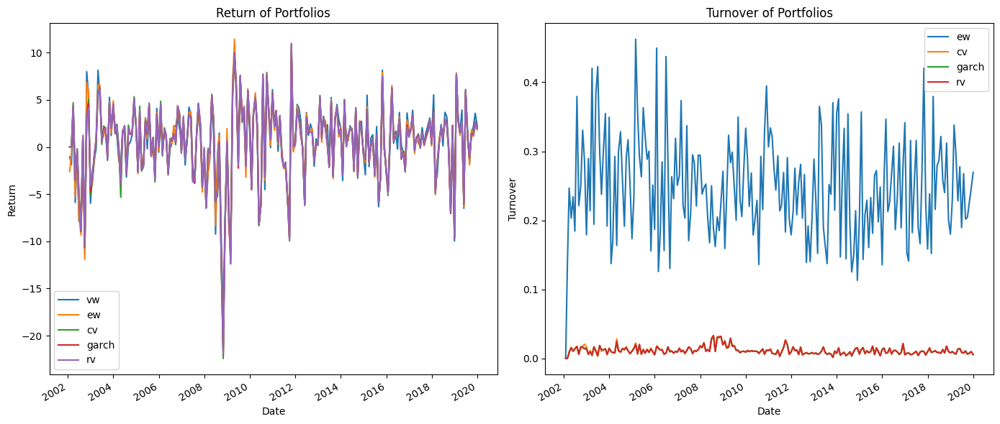

In [41]:
# Plot the returns and turnovers of portfolios
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (14, 6))

# Plot the return of portfolios on the first subplot
portfolios_return_df.plot(kind='line', ax = ax1, title = 'Return of Portfolios')
ax1.set_xlabel('Date')
ax1.set_ylabel('Return')

# Plot the turnover of portfolios on the second subplot
turnover_df.plot(kind='line', ax = ax2, title = 'Turnover of Portfolios')
ax2.set_xlabel('Date')
ax2.set_ylabel('Turnover')

fig.tight_layout()
plt.show()

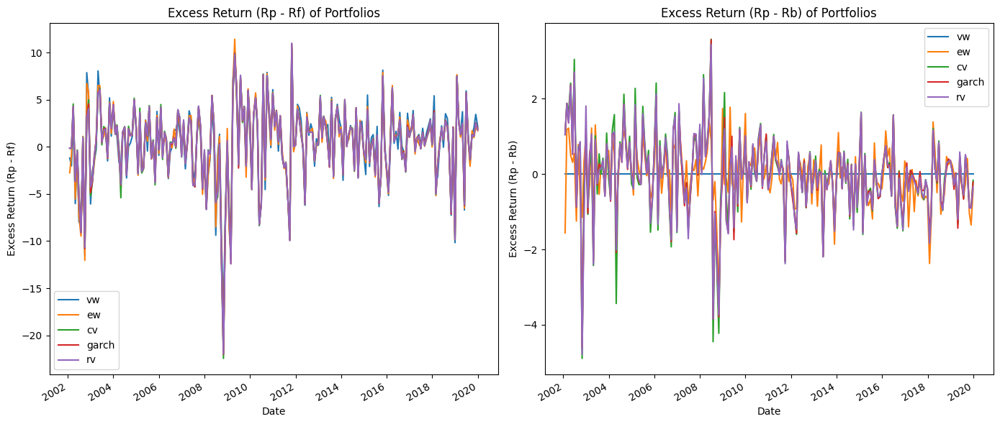

In [42]:
# Plot the excess returns of portfolios
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (14, 6))

# Plot the excess return (Rp - Rf) of portfolios on the first subplot
sr_df.plot(kind='line', ax = ax1, title = 'Excess Return (Rp - Rf) of Portfolios')
ax1.set_xlabel('Date')
ax1.set_ylabel('Excess Return (Rp - Rf)')

# Plot the excess return (Rp - Rb) of portfolios on the second subplot
ir_df.plot(kind='line', ax = ax2, title = 'Excess Return (Rp - Rb) of Portfolios')
ax2.set_xlabel('Date')
ax2.set_ylabel('Excess Return (Rp - Rb)')

fig.tight_layout()
plt.show()

**Model 2: Predict the volatility of ETFs using the volatility of S&P 500 ETF (IVV) and its first two lagged values**

$$\sigma^{ETF}_{t} = \phi^{ETF}_{0} + \phi^{ETF}_{1}\sigma^{S\&P500}_{t} + \phi^{ETF}_{2}\sigma^{S\&P500}_{t-1} + \phi^{ETF}_{3}\sigma^{S\&P500}_{t-2} + \varepsilon^{ETF}_{t}$$

In [43]:
# Part 1: GARCH
# Create DataFrames to store regression results
garch_coeffs_2 = pd.DataFrame()
garch_residuals_2 = pd.DataFrame()
garch_rsquared_2 = pd.DataFrame()
garch_pvalues_2 = pd.DataFrame()
garch_tstatistics_2 = pd.DataFrame()
garch_fstatistics_2 = pd.DataFrame()
garch_fpvalues_2 = pd.DataFrame()
garch_box_pierce_stats_2 = pd.DataFrame()
garch_box_pierce_pvalues_2 = pd.DataFrame()

# Loop through each ETF
for column in garch_df.columns.drop('ivv'):

    y = garch_df[column]
    y = y[3:]
    X = garch_df[['ivv']]
    X = X[1:]

    # Create lagged variables for x
    X['lag1'] = X['ivv'].shift(1)
    X['lag2'] = X['ivv'].shift(2)

    # Drop rows with NaN values due to lagging
    X = X.dropna()

    # Add constant to the predictor variable matrix
    X = sm.add_constant(X)

    # Perform OLS regression
    model = sm.OLS(y, X).fit()

    # Store coefficients and residuals
    garch_coeffs_2[column] = model.params.values
    garch_residuals_2[column] = model.resid
    garch_rsquared_2[column] = [model.rsquared]
    garch_pvalues_2[column] = model.pvalues.values
    garch_tstatistics_2[column] = model.tvalues.values
    garch_fstatistics_2[column] = [model.fvalue]
    garch_fpvalues_2[column] = [model.f_pvalue]

    # Perform the Box-Pierce test on the residuals
    box_pierce_result = acorr_ljungbox(model.resid, lags=[12], boxpierce=True)
    bp_stat = box_pierce_result.iloc[:, 0]
    bp_pvalue = box_pierce_result.iloc[:, 1]
    garch_box_pierce_stats_2[column] = bp_stat.values
    garch_box_pierce_pvalues_2[column] = bp_pvalue.values

In [44]:
print("GARCH coefficients:")
print(tabulate(garch_coeffs_2.round(3), headers='keys', tablefmt='pretty'))

print("GARCH coefficients p-values:")
print(tabulate(garch_pvalues_2.round(3), headers='keys', tablefmt='pretty'))

print("GARCH coefficients t-statistics:")
print(tabulate(garch_tstatistics_2.round(1), headers='keys', tablefmt='pretty'))

print("GARCH f-statistics:")
print(tabulate(garch_fstatistics_2.round(1), headers='keys', tablefmt='pretty'))

print("GARCH f-statistics p-values:")
print(tabulate(garch_fpvalues_2.round(2), headers='keys', tablefmt='pretty'))

print("GARCH Box-Pierce test statistics:")
print(tabulate(garch_box_pierce_stats_2.round(1), headers='keys', tablefmt='pretty'))

print("GARCH Box-Pierce test p-values:")
print(tabulate(garch_box_pierce_pvalues_2.round(3), headers='keys', tablefmt='pretty'))

GARCH coefficients:
+---+--------+--------+--------+-------+-------+--------+-------+--------+-------+-------+--------+
|   |  idu   |  iyc   |  iye   |  iyf  |  iyh  |  iyj   |  iyk  |  iym   |  iyr  |  iyw  |  iyz   |
+---+--------+--------+--------+-------+-------+--------+-------+--------+-------+-------+--------+
| 0 | 7.442  | 5.211  | 17.26  | -4.14 | 8.405 | 1.219  | 7.522 | 0.719  | 2.021 | 5.571 | 4.956  |
| 1 | 0.416  | 0.895  | 0.353  | 1.089 | 0.329 | 1.143  | 0.216 | 2.011  | 0.684 | 0.884 | 1.025  |
| 2 | -0.002 | 0.015  | 0.065  | 0.158 | 0.036 | -0.077 | 0.036 | -0.018 | 0.44  | 0.009 | 0.038  |
| 3 | 0.021  | -0.183 | -0.152 | 0.387 | -0.02 | 0.069  | 0.076 | -0.461 | 0.206 | 0.117 | -0.128 |
+---+--------+--------+--------+-------+-------+--------+-------+--------+-------+-------+--------+
GARCH coefficients p-values:
+---+-------+------+------+-------+-------+-------+-------+-------+-------+-------+-------+
|   |  idu  | iyc  | iye  |  iyf  |  iyh  |  iyj  |  iyk  |

In [45]:
# Part 2: Realized volatility
# Create DataFrames to store regression results
rv_coeffs_2 = pd.DataFrame()
rv_residuals_2 = pd.DataFrame()
rv_rsquared_2 = pd.DataFrame()
rv_pvalues_2 = pd.DataFrame()
rv_tstatistics_2 = pd.DataFrame()
rv_fstatistics_2 = pd.DataFrame()
rv_fpvalues_2 = pd.DataFrame()
rv_box_pierce_stats_2 = pd.DataFrame()
rv_box_pierce_pvalues_2 = pd.DataFrame()

# Loop through each ETF
for column in realized_vol_train.columns.drop('ivv'):

    y = realized_vol_train[column]
    y = y[3:]
    X = realized_vol_train[['ivv']]
    X = X[1:]

    # Create lagged variables for x
    X['lag1'] = X['ivv'].shift(1)
    X['lag2'] = X['ivv'].shift(2)

    # Drop rows with NaN values due to lagging
    X = X.dropna()

    # Add constant to the predictor variable matrix
    X = sm.add_constant(X)

    # Perform OLS regression
    model = sm.OLS(y, X).fit()

    # Store coefficients and residuals
    rv_coeffs_2[column] = model.params.values
    rv_residuals_2[column] = model.resid
    rv_rsquared_2[column] = [model.rsquared]
    rv_pvalues_2[column] = model.pvalues.values
    rv_tstatistics_2[column] = model.tvalues.values
    rv_fstatistics_2[column] = [model.fvalue]
    rv_fpvalues_2[column] = [model.f_pvalue]

    # Perform the Box-Pierce test on the residuals
    box_pierce_result = acorr_ljungbox(model.resid, lags=[12], boxpierce=True)
    bp_stat = box_pierce_result.iloc[:, 0]
    bp_pvalue = box_pierce_result.iloc[:, 1]
    rv_box_pierce_stats_2[column] = bp_stat.values
    rv_box_pierce_pvalues_2[column] = bp_pvalue.values

In [46]:
print("RV coefficients:")
print(tabulate(rv_coeffs_2.round(3), headers='keys', tablefmt='pretty'))

print("RV coefficients p-values:")
print(tabulate(rv_pvalues_2.round(3), headers='keys', tablefmt='pretty'))

print("RV coefficients t-statistics:")
print(tabulate(rv_tstatistics_2.round(1), headers='keys', tablefmt='pretty'))

print("RV f-statistics:")
print(tabulate(rv_fstatistics_2.round(1), headers='keys', tablefmt='pretty'))

print("RV f-statistics p-values:")
print(tabulate(rv_fpvalues_2.round(2), headers='keys', tablefmt='pretty'))

print("RV Box-Pierce test statistics:")
print(tabulate(rv_box_pierce_stats_2.round(1), headers='keys', tablefmt='pretty'))

print("RV Box-Pierce test p-values:")
print(tabulate(rv_box_pierce_pvalues_2.round(3), headers='keys', tablefmt='pretty'))

RV coefficients:
+---+--------+-------+--------+--------+--------+-------+-------+-------+--------+--------+--------+
|   |  idu   |  iyc  |  iye   |  iyf   |  iyh   |  iyj  |  iyk  |  iym  |  iyr   |  iyw   |  iyz   |
+---+--------+-------+--------+--------+--------+-------+-------+-------+--------+--------+--------+
| 0 | 3.989  | 1.891 | 5.591  | -6.467 | 4.783  | 1.413 | 2.671 | 1.77  | -6.296 | 4.903  |  2.57  |
| 1 | 0.786  | 0.874 | 1.233  | 1.274  | 0.733  | 0.911 | 0.727 | 1.115 | 1.058  | 0.985  | 0.978  |
| 2 | -0.002 | 0.047 | 0.112  | 0.087  | -0.006 | 0.086 | -0.03 | 0.133 | 0.297  | -0.005 | 0.083  |
| 3 | -0.052 | 0.007 | -0.201 | 0.385  | -0.065 | 0.051 | -0.03 | 0.075 | 0.397  | -0.007 | -0.002 |
+---+--------+-------+--------+--------+--------+-------+-------+-------+--------+--------+--------+
RV coefficients p-values:
+---+-------+-------+-------+------+-------+-------+-------+-------+-------+-------+-------+
|   |  idu  |  iyc  |  iye  | iyf  |  iyh  |  iyj  |  iy

**Predict the volatility of ETFs using the parameters obtained from the previous part regressions**

$$\hat{\sigma}^{ETF}_{t} = \hat{\phi}^{ETF}_{0} + \hat{\phi}^{ETF}_{1}\sigma^{S\&P500}_{t} + \hat{\phi}^{ETF}_{2}\sigma^{S\&P500}_{t-1} + \hat{\phi}^{ETF}_{3}\sigma^{S\&P500}_{t-2}$$

In [47]:
# GARCH
garch_pred_2 = pd.DataFrame()

for column in garch_coeffs_2.columns:
  garch_pred_2[column] = garch_coeffs_2.loc[0, column]\
                       + garch_coeffs_2.loc[1, column] * garch_df['ivv']\
                       + garch_coeffs_2.loc[2, column] * garch_df['ivv'].shift(1)\
                       + garch_coeffs_2.loc[3, column] * garch_df['ivv'].shift(2)

# Realized volatility
rv_pred_2 = pd.DataFrame()

for column in rv_coeffs_2.columns:
  rv_pred_2[column] = rv_coeffs_2.loc[0, column]\
                    + rv_coeffs_2.loc[1, column] * realized_vol_train['ivv']\
                    + rv_coeffs_2.loc[2, column] * realized_vol_train['ivv'].shift(1)\
                    + rv_coeffs_2.loc[3, column] * realized_vol_train['ivv'].shift(2)

**Calculate the weight of ETFs in the portfolio and normalize them**

$$W^{ETF}_{t} = \frac{\bar{\mu_{0,t}}}{\hat{\sigma}^{ETF}_{t}}$$

In [48]:
# garch portfolio weight = mu / sigma
garch_weight_2 = pd.DataFrame()

for column in garch_pred_2.columns:
  garch_weight_2[column] = monthly_cum_mean[column] / garch_pred_2[column]

numerator = garch_weight_2.sub(garch_weight_2.min(axis = 1), axis=0)
denominator = garch_weight_2.max(axis = 1) - garch_weight_2.min(axis = 1)
garch_normal_weight_2 = numerator.div(denominator, axis=0)
garch_normal_weight_2 = garch_normal_weight_2.div(garch_normal_weight_2.sum(axis = 1), axis=0)

# Realized volatility portfolio weight = mu / sigma
rv_weight_2 = pd.DataFrame()

for column in rv_pred_2.columns:
  rv_weight_2[column] = monthly_cum_mean[column] / rv_pred_2[column]

numerator = rv_weight_2.sub(rv_weight_2.min(axis = 1), axis=0)
denominator = rv_weight_2.max(axis = 1) - rv_weight_2.min(axis = 1)
rv_normal_weight_2 = numerator.div(denominator, axis=0)
rv_normal_weight_2 = rv_normal_weight_2.div(rv_normal_weight_2.sum(axis = 1), axis=0)

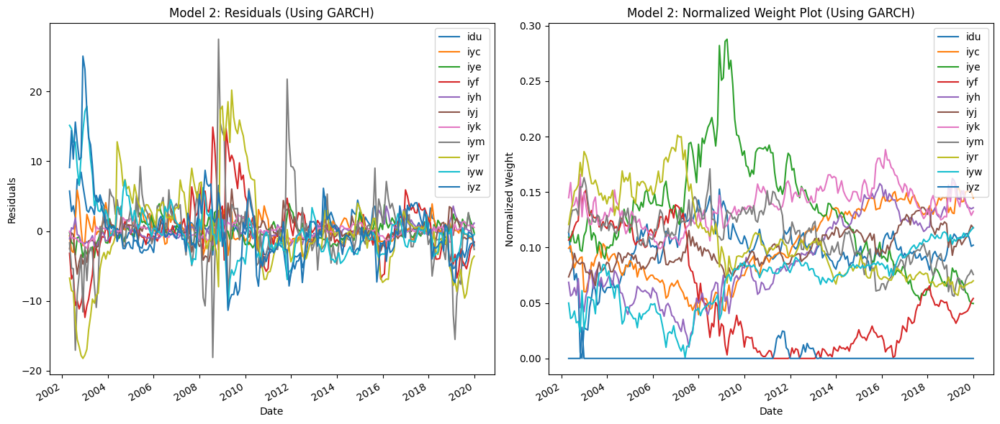

In [49]:
# Plot residuals and weights (Using GARCH)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# Plot ETFs residuals on the first subplot
garch_residuals_2.plot(kind='line', ax=ax1, title='Model 2: Residuals (Using GARCH)')
ax1.set_xlabel('Date')
ax1.set_ylabel('Residuals')

# Plot ETFs weights on the second subplot
garch_normal_weight_2.plot(kind='line', ax=ax2, title='Model 2: Normalized Weight Plot (Using GARCH)')
ax2.set_xlabel('Date')
ax2.set_ylabel('Normalized Weight')

fig.tight_layout()
plt.show()

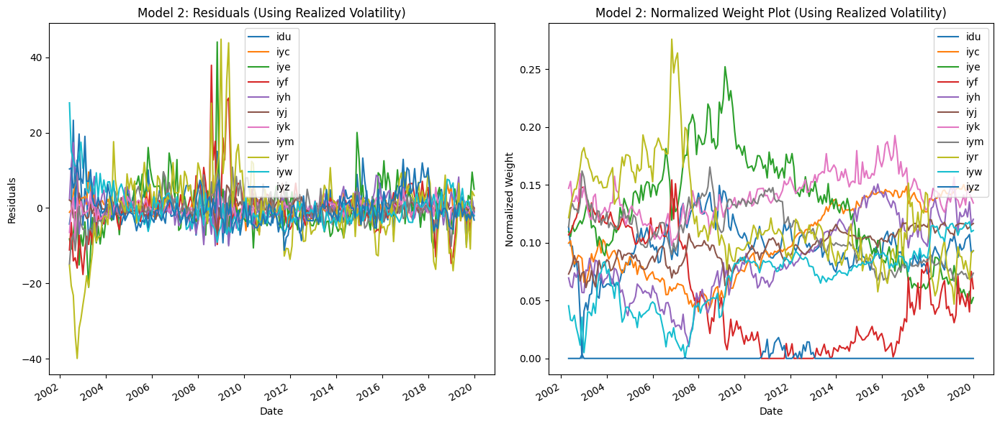

In [50]:
# Plot residuals and weights (Using GARCH)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# Plot ETFs residuals on the first subplot
rv_residuals_2.plot(kind='line', ax=ax1, title='Model 2: Residuals (Using Realized Volatility)')
ax1.set_xlabel('Date')
ax1.set_ylabel('Residuals')

# Plot ETFs weights on the second subplot
rv_normal_weight_2.plot(kind='line', ax=ax2, title='Model 2: Normalized Weight Plot (Using Realized Volatility)')
ax2.set_xlabel('Date')
ax2.set_ylabel('Normalized Weight')

fig.tight_layout()
plt.show()

Compare the Sharpe ratio, Information ratio, CER, turnover, and CRRA of the following portfolios:
*   Value weighted portfolio (IVV ETF)
*   Equal weighted portfolio
*   Constant volatility portfolio
*   GARCH portfolio
*   Realized volatility portfolio

In [51]:
# Calculate garch portfolio return
garch_portfolio_return_2 = garch_normal_weight_2.shift(1) * monthly_train.drop('ivv', axis = 1)
garch_portfolio_return_2['portfolio'] = garch_portfolio_return_2.sum(axis = 1)

print('GARCH portfolio returns:')
print(tabulate(garch_portfolio_return_2.head().round(4), headers='keys', tablefmt='pretty'))

# Calculate realized volatility portfolio return
rv_portfolio_return_2 = rv_normal_weight_2.shift(1) * monthly_train.drop('ivv', axis = 1)
rv_portfolio_return_2['portfolio'] = rv_portfolio_return_2.sum(axis = 1)

print('Realized volatility portfolio returns:')
print(tabulate(rv_portfolio_return_2.head().round(4), headers='keys', tablefmt='pretty'))

GARCH portfolio returns:
+---------------------+---------+---------+--------+---------+---------+--------+--------+--------+--------+---------+-----+-----------+
|        date         |   idu   |   iyc   |  iye   |   iyf   |   iyh   |  iyj   |  iyk   |  iym   |  iyr   |   iyw   | iyz | portfolio |
+---------------------+---------+---------+--------+---------+---------+--------+--------+--------+--------+---------+-----+-----------+
| 2002-01-31 00:00:00 |   nan   |   nan   |  nan   |   nan   |   nan   |  nan   |  nan   |  nan   |  nan   |   nan   | nan |    0.0    |
| 2002-02-28 00:00:00 |   nan   |   nan   |  nan   |   nan   |   nan   |  nan   |  nan   |  nan   |  nan   |   nan   | nan |    0.0    |
| 2002-03-28 00:00:00 |   nan   |   nan   |  nan   |   nan   |   nan   |  nan   |  nan   |  nan   |  nan   |   nan   | nan |    0.0    |
| 2002-04-30 00:00:00 |   nan   |   nan   |  nan   |   nan   |   nan   |  nan   |  nan   |  nan   |  nan   |   nan   | nan |    0.0    |
| 2002-05-31 00:

In [52]:
# Create a new dataframe to store the return of portfolios
portfolios_return_df_2 = pd.DataFrame({'vw':monthly_train['ivv'],
                                       'ew':ew_portfolio_return['portfolio'],
                                       'cv':cv_portfolio_return['portfolio'],
                                       'garch':garch_portfolio_return_2['portfolio'],
                                       'rv':rv_portfolio_return_2['portfolio']})

# Calculate the total return of all portfolios
print(f"Value-weighted portfolio total return: {portfolios_return_df_2.loc['2002-04-30':,'vw'].sum().round(2)}")
print(f"Equal-weighted portfolio total return: {portfolios_return_df_2.loc['2002-04-30':,'ew'].sum().round(2)}")
print(f"Constant Volatility portfolio total return: {portfolios_return_df_2.loc['2002-04-30':,'cv'].sum().round(2)}")
print(f"GARCH portfolio total return: {portfolios_return_df_2.loc['2002-04-30':,'garch'].sum().round(2)}")
print(f"Realized Volatility portfolio total return: {portfolios_return_df_2.loc['2002-04-30':,'rv'].sum().round(2)}")

Value-weighted portfolio total return: 103.79
Equal-weighted portfolio total return: 93.09
Constant Volatility portfolio total return: 94.73
GARCH portfolio total return: 98.28
Realized Volatility portfolio total return: 96.41


In [53]:
riskfree_subset_2 = riskfree_df.loc[portfolios_return_df_2.index.min():portfolios_return_df_2.index.max()]

# Calculate the Sharpe ratio of portfolios
sr_df_2 = portfolios_return_df_2.sub(riskfree_subset_2['riskfree'] / 12, axis = 0)

print(f"Value-weighted portfolio annual Sharpe ratio = {round(sr_df_2['vw'].mean()/portfolios_return_df_2['vw'].std() * np.sqrt(12), 4)}")
print(f"Equal-weighted portfolio annual Sharpe ratio = {round(sr_df_2['ew'].mean()/portfolios_return_df_2['ew'].std() * np.sqrt(12), 4)}")
print(f"Constant Volatility portfolio annual Sharpe ratio = {round(sr_df_2['cv'].mean()/portfolios_return_df_2['cv'].std() * np.sqrt(12), 4)}")
print(f"GARCH portfolio annual Sharpe ratio = {round(sr_df_2['garch'].mean()/portfolios_return_df_2['garch'].std() * np.sqrt(12), 4)}")
print(f"Realized Volatility portfolio annual Sharpe ratio = {round(sr_df_2['rv'].mean()/portfolios_return_df_2['rv'].std() * np.sqrt(12), 4)}")

print()
# Calculate the information ratio of portfolios
ir_df_2 = portfolios_return_df_2.sub(monthly_train['ivv'], axis = 0)

print(f"Value-weighted portfolio annual information ratio = {round(ir_df_2['vw'].mean()/ir_df_2['vw'].std() * np.sqrt(12), 4)}")
print(f"Equal-weighted portfolio annual information ratio = {round(ir_df_2['ew'].mean()/ir_df_2['ew'].std() * np.sqrt(12), 4)}")
print(f"Constant Volatility portfolio annual information ratio = {round(ir_df_2['cv'].mean()/ir_df_2['cv'].std() * np.sqrt(12), 4)}")
print(f"GARCH portfolio annual information ratio = {round(ir_df_2['garch'].mean()/ir_df_2['garch'].std() * np.sqrt(12), 4)}")
print(f"Realized Volatility portfolio annual information ratio = {round(ir_df_2['rv'].mean()/ir_df_2['rv'].std() * np.sqrt(12), 4)}")

print()
#Calculate the certainty equivalent return (CER) of portfolios
risk_aversion_coeff = 5

print(f"Value-weighted portfolio annual certainty equivalent return (CER) = {round((portfolios_return_df_2['vw'].mean() - 0.5 * risk_aversion_coeff * portfolios_return_df_2['vw'].var()/100) * 12 / 100, 4)}")
print(f"Equal-weighted portfolio annual certainty equivalent return (CER) = {round((portfolios_return_df_2['ew'].mean() - 0.5 * risk_aversion_coeff * portfolios_return_df_2['ew'].var()/100) * 12 / 100, 4)}")
print(f"Constant Volatility portfolio annual certainty equivalent return (CER) = {round((portfolios_return_df_2['cv'].mean() - 0.5 * risk_aversion_coeff * portfolios_return_df_2['cv'].var()/100) * 12 / 100, 4)}")
print(f"GARCH portfolio annual certainty equivalent return (CER) = {round((portfolios_return_df_2['garch'].mean() - 0.5 * risk_aversion_coeff * portfolios_return_df_2['garch'].var()/100) * 12 / 100, 4)}")
print(f"Realized Volatility portfolio annual certainty equivalent return (CER) = {round((portfolios_return_df_2['rv'].mean() - 0.5 * risk_aversion_coeff * portfolios_return_df_2['rv'].var()/100) * 12 / 100, 4)}")


Value-weighted portfolio annual Sharpe ratio = 0.3165
Equal-weighted portfolio annual Sharpe ratio = 0.27
Constant Volatility portfolio annual Sharpe ratio = 0.2942
GARCH portfolio annual Sharpe ratio = 0.2927
Realized Volatility portfolio annual Sharpe ratio = 0.2844

Value-weighted portfolio annual information ratio = nan
Equal-weighted portfolio annual information ratio = -0.2016
Constant Volatility portfolio annual information ratio = -0.0639
GARCH portfolio annual information ratio = -0.0808
Realized Volatility portfolio annual information ratio = -0.1039

Value-weighted portfolio annual certainty equivalent return (CER) = 0.008
Equal-weighted portfolio annual certainty equivalent return (CER) = -0.0003
Constant Volatility portfolio annual certainty equivalent return (CER) = 0.004
GARCH portfolio annual certainty equivalent return (CER) = 0.0043
Realized Volatility portfolio annual certainty equivalent return (CER) = 0.003


In [54]:
# Calculate GARCH portfolio turnover
garch_turnover_df_2 = garch_normal_weight_2.shift(1) * np.exp(monthly_train.drop('ivv', axis = 1) / 100)

numerator = garch_turnover_df_2.sub(garch_turnover_df_2.min(axis = 1), axis = 0)
denominator = garch_turnover_df_2.max(axis = 1) - garch_turnover_df_2.min(axis = 1)
garch_turnover_df_2 = numerator.div(denominator, axis = 0)
garch_turnover_df_2 = garch_turnover_df_2.div(garch_turnover_df_2.sum(axis = 1), axis=0)

garch_turnover_df_2 = garch_turnover_df_2 - garch_normal_weight_2.shift(1)
garch_turnover_df_2['turnover'] = garch_turnover_df_2.abs().sum(axis = 1) / 2

# Calculate realized volatility portfolio turnover
rv_turnover_df_2 = rv_normal_weight_2.shift(1) * np.exp(monthly_train.drop('ivv', axis = 1) / 100)

numerator = rv_turnover_df_2.sub(rv_turnover_df_2.min(axis = 1), axis = 0)
denominator = rv_turnover_df_2.max(axis = 1) - rv_turnover_df_2.min(axis = 1)
rv_turnover_df_2 = numerator.div(denominator, axis = 0)
rv_turnover_df_2 = rv_turnover_df_2.div(rv_turnover_df_2.sum(axis = 1), axis=0)

rv_turnover_df_2 = rv_turnover_df_2 - rv_normal_weight_2.shift(1)
rv_turnover_df_2['turnover'] = rv_turnover_df_2.abs().sum(axis = 1) / 2

# Create a new dataframe to store the turnover of portfolios
turnover_df_2 = pd.DataFrame({'ew':ew_turnover_df['turnover'],
                            'cv':cv_turnover_df['turnover'],
                            'garch':garch_turnover_df_2['turnover'],
                            'rv':rv_turnover_df_2['turnover'],
                            })

print(f"Equal-weighted portfolio average annual turnover: {round(turnover_df_2['ew'].mean() * 12, 4)}")
print(f"Constant volatility portfolio average annual turnover: {round(turnover_df_2['cv'].mean() * 12, 4)}")
print(f"GARCH portfolio average annual turnover: {round(turnover_df_2['garch'].mean() * 12, 4)}")
print(f"Realized volatility portfolio average annual turnover: {round(turnover_df_2['rv'].mean() * 12, 4)}")

Equal-weighted portfolio average annual turnover: 2.9824
Constant volatility portfolio average annual turnover: 0.1365
GARCH portfolio average annual turnover: 0.1327
Realized volatility portfolio average annual turnover: 0.1335


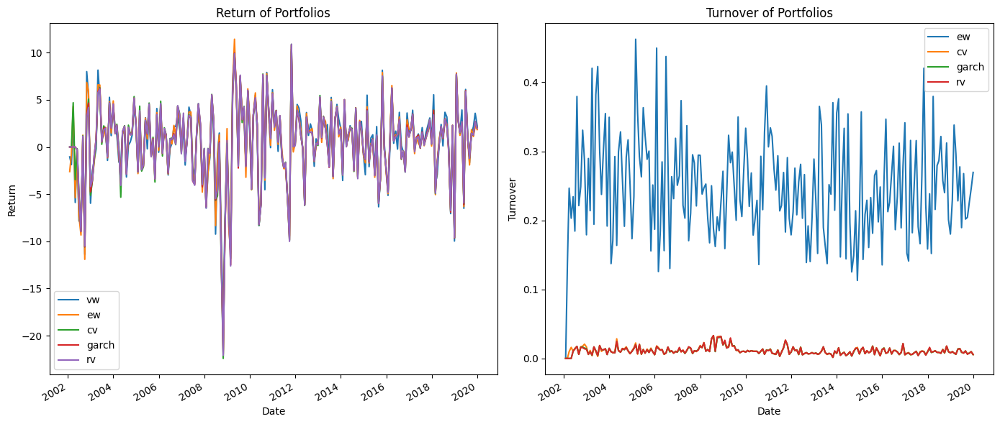

In [55]:
# Plot the returns and turnovers of portfolios
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (14, 6))

# Plot the return of portfolios on the first subplot
portfolios_return_df_2.plot(kind='line', ax = ax1, title = 'Return of Portfolios')
ax1.set_xlabel('Date')
ax1.set_ylabel('Return')

# Plot the turnover of portfolios on the second subplot
turnover_df_2.plot(kind='line', ax = ax2, title = 'Turnover of Portfolios')
ax2.set_xlabel('Date')
ax2.set_ylabel('Turnover')

fig.tight_layout()
plt.show()

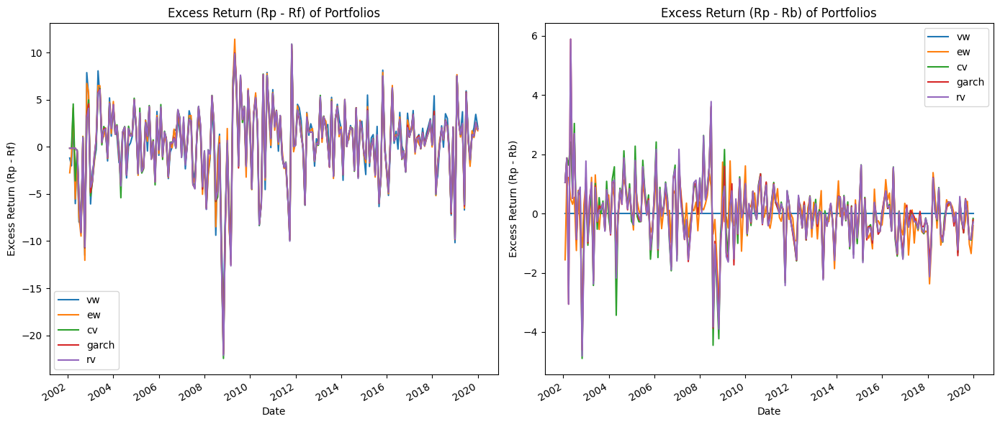

In [56]:
# Plot the excess returns of portfolios
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (14, 6))

# Plot the excess return (Rp - Rf) of portfolios on the first subplot
sr_df_2.plot(kind='line', ax = ax1, title = 'Excess Return (Rp - Rf) of Portfolios')
ax1.set_xlabel('Date')
ax1.set_ylabel('Excess Return (Rp - Rf)')

# Plot the excess return (Rp - Rb) of portfolios on the second subplot
ir_df_2.plot(kind='line', ax = ax2, title = 'Excess Return (Rp - Rb) of Portfolios')
ax2.set_xlabel('Date')
ax2.set_ylabel('Excess Return (Rp - Rb)')

fig.tight_layout()
plt.show()

**Model 3: Predict the volatility of ETFs using the explained part of their volatility from model 2 regression**

$$\sigma'^{ETF}_{t} = \gamma^{ETF}_{0} + \gamma^{ETF}_{1}\hat{\sigma}^{ETF}_{t} + \varepsilon^{ETF}_{t}$$

Where

$$\hat{\sigma}^{ETF}_{t} = \hat{\phi}^{ETF}_{0} + \hat{\phi}^{ETF}_{1}\sigma^{S\&P500}_{t} + \hat{\phi}^{ETF}_{2}\sigma^{S\&P500}_{t-1} + \hat{\phi}^{ETF}_{3}\sigma^{S\&P500}_{t-2}$$

In [57]:
# Part 1: GARCH
# Create DataFrames to store regression results
garch_coeffs_3 = pd.DataFrame()
garch_residuals_3 = pd.DataFrame()
garch_rsquared_3 = pd.DataFrame()
garch_pvalues_3 = pd.DataFrame()
garch_tstatistics_3 = pd.DataFrame()
garch_fstatistics_3 = pd.DataFrame()
garch_fpvalues_3 = pd.DataFrame()
garch_box_pierce_stats_3 = pd.DataFrame()
garch_box_pierce_pvalues_3 = pd.DataFrame()

# Loop through each ETF
for column in garch_df.columns.drop('ivv'):

    y = garch_df[column]
    y = y[3:]
    X = garch_pred_2[column]
    X = X[3:]

    # Add constant to the predictor variable matrix
    X = sm.add_constant(X)

    # Perform OLS regression
    model = sm.OLS(y, X).fit()

    # Store coefficients and residuals
    garch_coeffs_3[column] = model.params.values
    garch_residuals_3[column] = model.resid
    garch_rsquared_3[column] = [model.rsquared]
    garch_pvalues_3[column] = model.pvalues.values
    garch_tstatistics_3[column] = model.tvalues.values
    garch_fstatistics_3[column] = [model.fvalue]
    garch_fpvalues_3[column] = [model.f_pvalue]

    # Perform the Box-Pierce test on the residuals
    box_pierce_result = acorr_ljungbox(model.resid, lags=[12], boxpierce=True)
    bp_stat = box_pierce_result.iloc[:, 0]
    bp_pvalue = box_pierce_result.iloc[:, 1]
    garch_box_pierce_stats_3[column] = bp_stat.values
    garch_box_pierce_pvalues_3[column] = bp_pvalue.values

In [58]:
print("GARCH coefficients:")
print(tabulate(garch_coeffs_3.round(3), headers='keys', tablefmt='pretty'))

print("GARCH coefficients p-values:")
print(tabulate(garch_pvalues_3.round(3), headers='keys', tablefmt='pretty'))

print("GARCH coefficients t-statistics:")
print(tabulate(garch_tstatistics_3.round(1), headers='keys', tablefmt='pretty'))

print("GARCH f-statistics:")
print(tabulate(garch_fstatistics_3.round(1), headers='keys', tablefmt='pretty'))

print("GARCH f-statistics p-values:")
print(tabulate(garch_fpvalues_3.round(2), headers='keys', tablefmt='pretty'))

print("GARCH Box-Pierce test statistics:")
print(tabulate(garch_box_pierce_stats_3.round(1), headers='keys', tablefmt='pretty'))

print("GARCH Box-Pierce test p-values:")
print(tabulate(garch_box_pierce_pvalues_3.round(3), headers='keys', tablefmt='pretty'))

GARCH coefficients:
+---+------+------+------+------+------+------+-----+------+-----+------+------+
|   | idu  | iyc  | iye  | iyf  | iyh  | iyj  | iyk | iym  | iyr | iyw  | iyz  |
+---+------+------+------+------+------+------+-----+------+-----+------+------+
| 0 | -0.0 | -0.0 | -0.0 | -0.0 | -0.0 | -0.0 | 0.0 | -0.0 | 0.0 | -0.0 | -0.0 |
| 1 | 1.0  | 1.0  | 1.0  | 1.0  | 1.0  | 1.0  | 1.0 | 1.0  | 1.0 | 1.0  | 1.0  |
+---+------+------+------+------+------+------+-----+------+-----+------+------+
GARCH coefficients p-values:
+---+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+
|   | idu | iyc | iye | iyf | iyh | iyj | iyk | iym | iyr | iyw | iyz |
+---+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+
| 0 | 1.0 | 1.0 | 1.0 | 1.0 | 1.0 | 1.0 | 1.0 | 1.0 | 1.0 | 1.0 | 1.0 |
| 1 | 0.0 | 0.0 | 0.0 | 0.0 | 0.0 | 0.0 | 0.0 | 0.0 | 0.0 | 0.0 | 0.0 |
+---+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+
GARCH coefficients t-statistics:


In [59]:
# Part 2: Realized volatility
# Create DataFrames to store regression results
rv_coeffs_3 = pd.DataFrame()
rv_residuals_3 = pd.DataFrame()
rv_rsquared_3 = pd.DataFrame()
rv_pvalues_3 = pd.DataFrame()
rv_tstatistics_3 = pd.DataFrame()
rv_fstatistics_3 = pd.DataFrame()
rv_fpvalues_3 = pd.DataFrame()
rv_box_pierce_stats_3 = pd.DataFrame()
rv_box_pierce_pvalues_3 = pd.DataFrame()

# Loop through each ETF
for column in realized_vol_train.columns.drop('ivv'):

    y = realized_vol_train[column]
    y = y[3:]
    X = rv_pred_2[column]
    X = X[3:]

    # Add constant to the predictor variable matrix
    X = sm.add_constant(X)

    # Perform OLS regression
    model = sm.OLS(y, X).fit()

    # Store coefficients and residuals
    rv_coeffs_3[column] = model.params.values
    rv_residuals_3[column] = model.resid
    rv_rsquared_3[column] = [model.rsquared]
    rv_pvalues_3[column] = model.pvalues.values
    rv_tstatistics_3[column] = model.tvalues.values
    rv_fstatistics_3[column] = [model.fvalue]
    rv_fpvalues_3[column] = [model.f_pvalue]

    # Perform the Box-Pierce test on the residuals
    box_pierce_result = acorr_ljungbox(model.resid, lags=[12], boxpierce=True)
    bp_stat = box_pierce_result.iloc[:, 0]
    bp_pvalue = box_pierce_result.iloc[:, 1]
    rv_box_pierce_stats_3[column] = bp_stat.values
    rv_box_pierce_pvalues_3[column] = bp_pvalue.values

In [60]:
print("RV coefficients:")
print(tabulate(rv_coeffs_3.round(3), headers='keys', tablefmt='pretty'))

print("RV coefficients p-values:")
print(tabulate(rv_pvalues_3.round(3), headers='keys', tablefmt='pretty'))

print("RV coefficients t-statistics:")
print(tabulate(rv_tstatistics_3.round(1), headers='keys', tablefmt='pretty'))

print("RV f-statistics:")
print(tabulate(rv_fstatistics_3.round(1), headers='keys', tablefmt='pretty'))

print("RV f-statistics p-values:")
print(tabulate(rv_fpvalues_3.round(2), headers='keys', tablefmt='pretty'))

print("RV Box-Pierce test statistics:")
print(tabulate(rv_box_pierce_stats_3.round(1), headers='keys', tablefmt='pretty'))

print("RV Box-Pierce test p-values:")
print(tabulate(rv_box_pierce_pvalues_3.round(3), headers='keys', tablefmt='pretty'))

RV coefficients:
+---+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+
|   | idu | iyc | iye | iyf | iyh | iyj | iyk | iym | iyr | iyw | iyz |
+---+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+
| 0 | 0.0 | 0.0 | 0.0 | 0.0 | 0.0 | 0.0 | 0.0 | 0.0 | 0.0 | 0.0 | 0.0 |
| 1 | 1.0 | 1.0 | 1.0 | 1.0 | 1.0 | 1.0 | 1.0 | 1.0 | 1.0 | 1.0 | 1.0 |
+---+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+
RV coefficients p-values:
+---+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+
|   | idu | iyc | iye | iyf | iyh | iyj | iyk | iym | iyr | iyw | iyz |
+---+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+
| 0 | 1.0 | 1.0 | 1.0 | 1.0 | 1.0 | 1.0 | 1.0 | 1.0 | 1.0 | 1.0 | 1.0 |
| 1 | 0.0 | 0.0 | 0.0 | 0.0 | 0.0 | 0.0 | 0.0 | 0.0 | 0.0 | 0.0 | 0.0 |
+---+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+
RV coefficients t-statistics:
+---+------+------+------+------+------+------+------+------+--

**Predict the volatility of ETFs using the parameters obtained from the previous part regressions**

$$\hat{\sigma'}^{ETF}_{t} = \hat{\gamma}^{ETF}_{0} + \hat{\gamma}^{ETF}_{1}\hat{\sigma}^{ETF}_{t}$$

In [61]:
# GARCH
garch_pred_3 = pd.DataFrame()

for column in garch_coeffs_3.columns:
  garch_pred_3[column] = garch_coeffs_3.loc[0, column] + garch_coeffs_3.loc[1, column] * garch_pred_2[column]

# Realized volatility
rv_pred_3 = pd.DataFrame()

for column in rv_coeffs_3.columns:
  rv_pred_3[column] = rv_coeffs_3.loc[0, column] + rv_coeffs_3.loc[1, column] * rv_pred_2[column]

**Calculate the weight of ETFs in the portfolio and normalize them**

$$W^{ETF}_{t} = \frac{\bar{\mu_{0,t}}}{\hat{\sigma}^{ETF}_{t}}$$

In [62]:
# garch portfolio weight = mu / sigma
garch_weight_3 = pd.DataFrame()

for column in garch_pred_3.columns:
  garch_weight_3[column] = monthly_cum_mean[column] / garch_pred_3[column]

numerator = garch_weight_3.sub(garch_weight_3.min(axis = 1), axis=0)
denominator = garch_weight_3.max(axis = 1) - garch_weight_3.min(axis = 1)
garch_normal_weight_3 = numerator.div(denominator, axis=0)
garch_normal_weight_3 = garch_normal_weight_3.div(garch_normal_weight_3.sum(axis = 1), axis=0)

# Realized volatility portfolio weight = mu / sigma
rv_weight_3 = pd.DataFrame()

for column in rv_pred_3.columns:
  rv_weight_3[column] = monthly_cum_mean[column] / rv_pred_3[column]

numerator = rv_weight_3.sub(rv_weight_3.min(axis = 1), axis=0)
denominator = rv_weight_3.max(axis = 1) - rv_weight_3.min(axis = 1)
rv_normal_weight_3 = numerator.div(denominator, axis=0)
rv_normal_weight_3 = rv_normal_weight_3.div(rv_normal_weight_3.sum(axis = 1), axis=0)

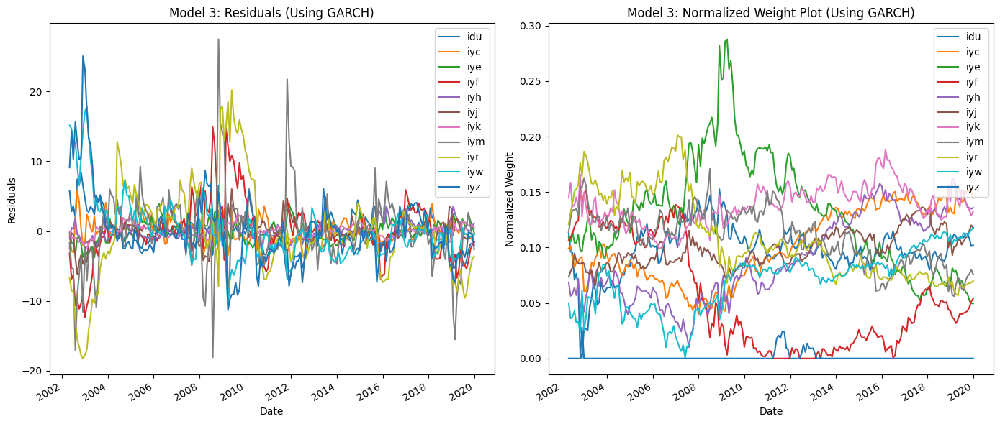

In [63]:
# Plot residuals and weights (Using GARCH)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# Plot ETFs residuals on the first subplot
garch_residuals_3.plot(kind='line', ax=ax1, title='Model 3: Residuals (Using GARCH)')
ax1.set_xlabel('Date')
ax1.set_ylabel('Residuals')

# Plot ETFs weights on the second subplot
garch_normal_weight_3.plot(kind='line', ax=ax2, title='Model 3: Normalized Weight Plot (Using GARCH)')
ax2.set_xlabel('Date')
ax2.set_ylabel('Normalized Weight')

fig.tight_layout()
plt.show()

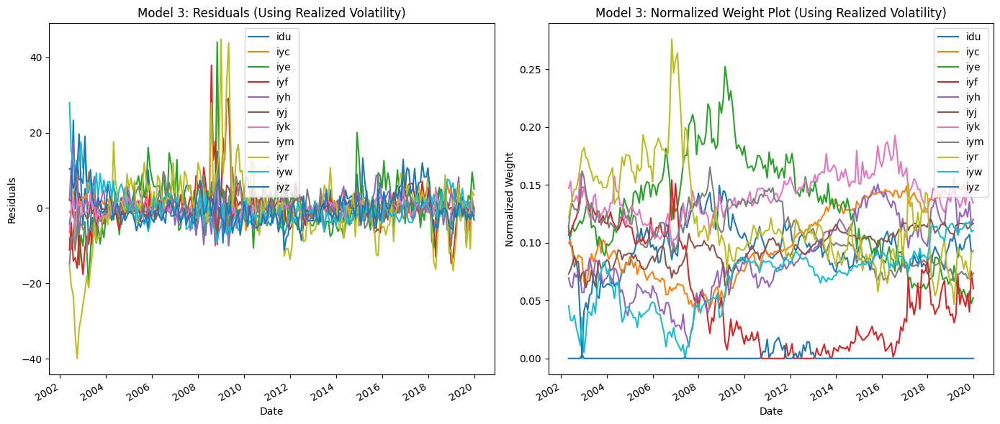

In [64]:
# Plot residuals and weights (Using GARCH)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# Plot ETFs residuals on the first subplot
rv_residuals_3.plot(kind='line', ax=ax1, title='Model 3: Residuals (Using Realized Volatility)')
ax1.set_xlabel('Date')
ax1.set_ylabel('Residuals')

# Plot ETFs weights on the second subplot
rv_normal_weight_3.plot(kind='line', ax=ax2, title='Model 3: Normalized Weight Plot (Using Realized Volatility)')
ax2.set_xlabel('Date')
ax2.set_ylabel('Normalized Weight')

fig.tight_layout()
plt.show()

Compare the Sharpe ratio, Information ratio, CER, turnover, and CRRA of the following portfolios:
*   Value weighted portfolio (IVV ETF)
*   Equal weighted portfolio
*   Constant volatility portfolio
*   GARCH portfolio
*   Realized volatility portfolio

In [65]:
# Calculate garch portfolio return
garch_portfolio_return_3 = garch_normal_weight_3.shift(1) * monthly_train.drop('ivv', axis = 1)
garch_portfolio_return_3['portfolio'] = garch_portfolio_return_3.sum(axis = 1)

print('GARCH portfolio returns:')
print(tabulate(garch_portfolio_return_3.head().round(4), headers='keys', tablefmt='pretty'))

# Calculate realized volatility portfolio return
rv_portfolio_return_3 = rv_normal_weight_3.shift(1) * monthly_train.drop('ivv', axis = 1)
rv_portfolio_return_3['portfolio'] = rv_portfolio_return_3.sum(axis = 1)

print('Realized volatility portfolio returns:')
print(tabulate(rv_portfolio_return_3.head().round(4), headers='keys', tablefmt='pretty'))

GARCH portfolio returns:
+---------------------+---------+---------+--------+---------+---------+--------+--------+--------+--------+---------+-----+-----------+
|        date         |   idu   |   iyc   |  iye   |   iyf   |   iyh   |  iyj   |  iyk   |  iym   |  iyr   |   iyw   | iyz | portfolio |
+---------------------+---------+---------+--------+---------+---------+--------+--------+--------+--------+---------+-----+-----------+
| 2002-01-31 00:00:00 |   nan   |   nan   |  nan   |   nan   |   nan   |  nan   |  nan   |  nan   |  nan   |   nan   | nan |    0.0    |
| 2002-02-28 00:00:00 |   nan   |   nan   |  nan   |   nan   |   nan   |  nan   |  nan   |  nan   |  nan   |   nan   | nan |    0.0    |
| 2002-03-28 00:00:00 |   nan   |   nan   |  nan   |   nan   |   nan   |  nan   |  nan   |  nan   |  nan   |   nan   | nan |    0.0    |
| 2002-04-30 00:00:00 |   nan   |   nan   |  nan   |   nan   |   nan   |  nan   |  nan   |  nan   |  nan   |   nan   | nan |    0.0    |
| 2002-05-31 00:

In [66]:
# Create a new dataframe to store the return of portfolios
portfolios_return_df_3 = pd.DataFrame({'vw':monthly_train['ivv'],
                                       'ew':ew_portfolio_return['portfolio'],
                                       'cv':cv_portfolio_return['portfolio'],
                                       'garch':garch_portfolio_return_3['portfolio'],
                                       'rv':rv_portfolio_return_3['portfolio']})

# Calculate the total return of all portfolios
print(f"Value-weighted portfolio total return: {portfolios_return_df_3.loc['2002-04-30':,'vw'].sum().round(2)}")
print(f"Equal-weighted portfolio total return: {portfolios_return_df_3.loc['2002-04-30':,'ew'].sum().round(2)}")
print(f"Constant Volatility portfolio total return: {portfolios_return_df_3.loc['2002-04-30':,'cv'].sum().round(2)}")
print(f"GARCH portfolio total return: {portfolios_return_df_3.loc['2002-04-30':,'garch'].sum().round(2)}")
print(f"Realized Volatility portfolio total return: {portfolios_return_df_3.loc['2002-04-30':,'rv'].sum().round(2)}")

Value-weighted portfolio total return: 103.79
Equal-weighted portfolio total return: 93.09
Constant Volatility portfolio total return: 94.73
GARCH portfolio total return: 98.28
Realized Volatility portfolio total return: 96.41


In [67]:
riskfree_subset_3 = riskfree_df.loc[portfolios_return_df_3.index.min():portfolios_return_df_3.index.max()]

# Calculate the Sharpe ratio of portfolios
sr_df_3 = portfolios_return_df_3.sub(riskfree_subset_3['riskfree'] / 12, axis = 0)

print(f"Value-weighted portfolio annual Sharpe ratio = {round(sr_df_3['vw'].mean()/portfolios_return_df_3['vw'].std() * np.sqrt(12), 4)}")
print(f"Equal-weighted portfolio annual Sharpe ratio = {round(sr_df_3['ew'].mean()/portfolios_return_df_3['ew'].std() * np.sqrt(12), 4)}")
print(f"Constant Volatility portfolio annual Sharpe ratio = {round(sr_df_3['cv'].mean()/portfolios_return_df_3['cv'].std() * np.sqrt(12), 4)}")
print(f"GARCH portfolio annual Sharpe ratio = {round(sr_df_3['garch'].mean()/portfolios_return_df_3['garch'].std() * np.sqrt(12), 4)}")
print(f"Realized Volatility portfolio annual Sharpe ratio = {round(sr_df_3['rv'].mean()/portfolios_return_df_3['rv'].std() * np.sqrt(12), 4)}")

print()
# Calculate the information ratio of portfolios
ir_df_3 = portfolios_return_df_3.sub(monthly_train['ivv'], axis = 0)

print(f"Value-weighted portfolio annual information ratio = {round(ir_df_3['vw'].mean()/ir_df_3['vw'].std() * np.sqrt(12), 4)}")
print(f"Equal-weighted portfolio annual information ratio = {round(ir_df_3['ew'].mean()/ir_df_3['ew'].std() * np.sqrt(12), 4)}")
print(f"Constant Volatility portfolio annual information ratio = {round(ir_df_3['cv'].mean()/ir_df_3['cv'].std() * np.sqrt(12), 4)}")
print(f"GARCH portfolio annual information ratio = {round(ir_df_3['garch'].mean()/ir_df_3['garch'].std() * np.sqrt(12), 4)}")
print(f"Realized Volatility portfolio annual information ratio = {round(ir_df_3['rv'].mean()/ir_df_3['rv'].std() * np.sqrt(12), 4)}")

print()
#Calculate the certainty equivalent return (CER) of portfolios
risk_aversion_coeff = 5

print(f"Value-weighted portfolio annual certainty equivalent return (CER) = {round((portfolios_return_df_3['vw'].mean() - 0.5 * risk_aversion_coeff * portfolios_return_df_3['vw'].var()/100) * 12 / 100, 4)}")
print(f"Equal-weighted portfolio annual certainty equivalent return (CER) = {round((portfolios_return_df_3['ew'].mean() - 0.5 * risk_aversion_coeff * portfolios_return_df_3['ew'].var()/100) * 12 / 100, 4)}")
print(f"Constant Volatility portfolio annual certainty equivalent return (CER) = {round((portfolios_return_df_3['cv'].mean() - 0.5 * risk_aversion_coeff * portfolios_return_df_3['cv'].var()/100) * 12 / 100, 4)}")
print(f"GARCH portfolio annual certainty equivalent return (CER) = {round((portfolios_return_df_3['garch'].mean() - 0.5 * risk_aversion_coeff * portfolios_return_df_3['garch'].var()/100) * 12 / 100, 4)}")
print(f"Realized Volatility portfolio annual certainty equivalent return (CER) = {round((portfolios_return_df_3['rv'].mean() - 0.5 * risk_aversion_coeff * portfolios_return_df_3['rv'].var()/100) * 12 / 100, 4)}")


Value-weighted portfolio annual Sharpe ratio = 0.3165
Equal-weighted portfolio annual Sharpe ratio = 0.27
Constant Volatility portfolio annual Sharpe ratio = 0.2942
GARCH portfolio annual Sharpe ratio = 0.2927
Realized Volatility portfolio annual Sharpe ratio = 0.2844

Value-weighted portfolio annual information ratio = nan
Equal-weighted portfolio annual information ratio = -0.2016
Constant Volatility portfolio annual information ratio = -0.0639
GARCH portfolio annual information ratio = -0.0808
Realized Volatility portfolio annual information ratio = -0.1039

Value-weighted portfolio annual certainty equivalent return (CER) = 0.008
Equal-weighted portfolio annual certainty equivalent return (CER) = -0.0003
Constant Volatility portfolio annual certainty equivalent return (CER) = 0.004
GARCH portfolio annual certainty equivalent return (CER) = 0.0043
Realized Volatility portfolio annual certainty equivalent return (CER) = 0.003


In [68]:
# Calculate GARCH portfolio turnover
garch_turnover_df_3 = garch_normal_weight_3.shift(1) * np.exp(monthly_train.drop('ivv', axis = 1) / 100)

numerator = garch_turnover_df_3.sub(garch_turnover_df_3.min(axis = 1), axis = 0)
denominator = garch_turnover_df_3.max(axis = 1) - garch_turnover_df_3.min(axis = 1)
garch_turnover_df_3 = numerator.div(denominator, axis = 0)
garch_turnover_df_3 = garch_turnover_df_3.div(garch_turnover_df_3.sum(axis = 1), axis=0)

garch_turnover_df_3 = garch_turnover_df_3 - garch_normal_weight_3.shift(1)
garch_turnover_df_3['turnover'] = garch_turnover_df_3.abs().sum(axis = 1) / 2

# Calculate realized volatility portfolio turnover
rv_turnover_df_3 = rv_normal_weight_3.shift(1) * np.exp(monthly_train.drop('ivv', axis = 1) / 100)

numerator = rv_turnover_df_3.sub(rv_turnover_df_3.min(axis = 1), axis = 0)
denominator = rv_turnover_df_3.max(axis = 1) - rv_turnover_df_3.min(axis = 1)
rv_turnover_df_3 = numerator.div(denominator, axis = 0)
rv_turnover_df_3 = rv_turnover_df_3.div(rv_turnover_df_3.sum(axis = 1), axis=0)

rv_turnover_df_3 = rv_turnover_df_3 - rv_normal_weight_3.shift(1)
rv_turnover_df_3['turnover'] = rv_turnover_df_3.abs().sum(axis = 1) / 2

# Create a new dataframe to store the turnover of portfolios
turnover_df_3 = pd.DataFrame({'ew':ew_turnover_df['turnover'],
                            'cv':cv_turnover_df['turnover'],
                            'garch':garch_turnover_df_3['turnover'],
                            'rv':rv_turnover_df_3['turnover'],
                            })

print(f"Equal-weighted portfolio average annual turnover: {round(turnover_df_3['ew'].mean() * 12, 4)}")
print(f"Constant volatility portfolio average annual turnover: {round(turnover_df_3['cv'].mean() * 12, 4)}")
print(f"GARCH portfolio average annual turnover: {round(turnover_df_3['garch'].mean() * 12, 4)}")
print(f"Realized volatility portfolio average annual turnover: {round(turnover_df_3['rv'].mean() * 12, 4)}")

Equal-weighted portfolio average annual turnover: 2.9824
Constant volatility portfolio average annual turnover: 0.1365
GARCH portfolio average annual turnover: 0.1327
Realized volatility portfolio average annual turnover: 0.1335


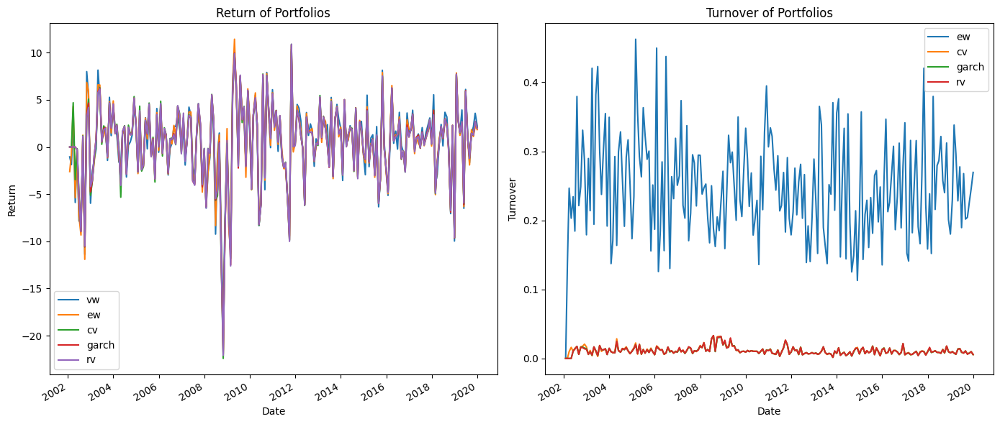

In [69]:
# Plot the returns and turnovers of portfolios
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (14, 6))

# Plot the return of portfolios on the first subplot
portfolios_return_df_3.plot(kind='line', ax = ax1, title = 'Return of Portfolios')
ax1.set_xlabel('Date')
ax1.set_ylabel('Return')

# Plot the turnover of portfolios on the second subplot
turnover_df_3.plot(kind='line', ax = ax2, title = 'Turnover of Portfolios')
ax2.set_xlabel('Date')
ax2.set_ylabel('Turnover')

fig.tight_layout()
plt.show()

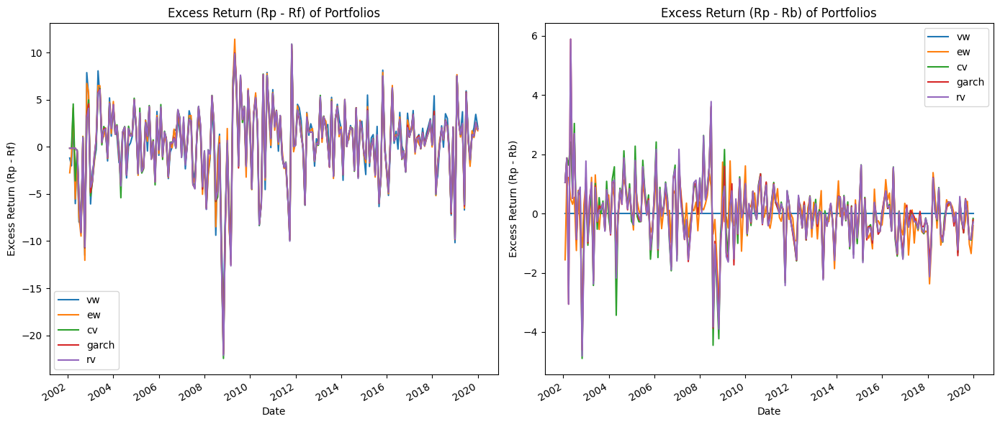

In [70]:
# Plot the excess returns of portfolios
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (14, 6))

# Plot the excess return (Rp - Rf) of portfolios on the first subplot
sr_df_3.plot(kind='line', ax = ax1, title = 'Excess Return (Rp - Rf) of Portfolios')
ax1.set_xlabel('Date')
ax1.set_ylabel('Excess Return (Rp - Rf)')

# Plot the excess return (Rp - Rb) of portfolios on the second subplot
ir_df_3.plot(kind='line', ax = ax2, title = 'Excess Return (Rp - Rb) of Portfolios')
ax2.set_xlabel('Date')
ax2.set_ylabel('Excess Return (Rp - Rb)')

fig.tight_layout()
plt.show()

**Model 4: Predict the volatility of ETFs using the explained part of their volatility from model 2 regression and their first two lagged values**

$$\sigma'^{ETF}_{t} = \gamma^{ETF}_{0} + \gamma^{ETF}_{1}\hat{\sigma}^{ETF}_{t-1} + \gamma^{ETF}_{2}\hat{\sigma}^{ETF}_{t-2} + \varepsilon^{ETF}_{t}$$

Where

$$\hat{\sigma}^{ETF}_{t} = \hat{\phi}^{ETF}_{0} + \hat{\phi}^{ETF}_{1}\sigma^{S\&P500}_{t} + \hat{\phi}^{ETF}_{2}\sigma^{S\&P500}_{t-1} + \hat{\phi}^{ETF}_{3}\sigma^{S\&P500}_{t-2}$$

In [71]:
# Part 1: GARCH
# Create DataFrames to store regression results
garch_coeffs_4 = pd.DataFrame()
garch_residuals_4 = pd.DataFrame()
garch_rsquared_4 = pd.DataFrame()
garch_pvalues_4 = pd.DataFrame()
garch_tstatistics_4 = pd.DataFrame()
garch_fstatistics_4 = pd.DataFrame()
garch_fpvalues_4 = pd.DataFrame()
garch_box_pierce_stats_4 = pd.DataFrame()
garch_box_pierce_pvalues_4 = pd.DataFrame()

# Loop through each ETF
for column in garch_df.columns.drop('ivv'):

    y = garch_df[column]
    y = y[5:]
    X = garch_pred_2[[column]].shift(1)
    #X = X[1:]

    # Create lagged variables for x
    X['lag1'] = X[column].shift(1)
    #X['lag2'] = X[column].shift(2)

    # Drop rows with NaN values due to lagging
    X = X.dropna()

    # Add constant to the predictor variable matrix
    X = sm.add_constant(X)

    # Perform OLS regression
    model = sm.OLS(y, X).fit()

    # Store coefficients and residuals
    garch_coeffs_4[column] = model.params.values
    garch_residuals_4[column] = model.resid
    garch_rsquared_4[column] = [model.rsquared]
    garch_pvalues_4[column] = model.pvalues.values
    garch_tstatistics_4[column] = model.tvalues.values
    garch_fstatistics_4[column] = [model.fvalue]
    garch_fpvalues_4[column] = [model.f_pvalue]

    # Perform the Box-Pierce test on the residuals
    box_pierce_result = acorr_ljungbox(model.resid, lags=[12], boxpierce=True)
    bp_stat = box_pierce_result.iloc[:, 0]
    bp_pvalue = box_pierce_result.iloc[:, 1]
    garch_box_pierce_stats_4[column] = bp_stat.values
    garch_box_pierce_pvalues_4[column] = bp_pvalue.values

In [72]:
print("GARCH coefficients:")
print(tabulate(garch_coeffs_4.round(3), headers='keys', tablefmt='pretty'))

print("GARCH coefficients p-values:")
print(tabulate(garch_pvalues_4.round(3), headers='keys', tablefmt='pretty'))

print("GARCH coefficients t-statistics:")
print(tabulate(garch_tstatistics_4.round(1), headers='keys', tablefmt='pretty'))

print("GARCH f-statistics:")
print(tabulate(garch_fstatistics_4.round(1), headers='keys', tablefmt='pretty'))

print("GARCH f-statistics p-values:")
print(tabulate(garch_fpvalues_4.round(2), headers='keys', tablefmt='pretty'))

print("GARCH Box-Pierce test statistics:")
print(tabulate(garch_box_pierce_stats_4.round(1), headers='keys', tablefmt='pretty'))

print("GARCH Box-Pierce test p-values:")
print(tabulate(garch_box_pierce_pvalues_4.round(3), headers='keys', tablefmt='pretty'))

GARCH coefficients:
+---+-------+--------+--------+--------+--------+-------+--------+--------+--------+--------+--------+
|   |  idu  |  iyc   |  iye   |  iyf   |  iyh   |  iyj  |  iyk   |  iym   |  iyr   |  iyw   |  iyz   |
+---+-------+--------+--------+--------+--------+-------+--------+--------+--------+--------+--------+
| 0 | 1.218 | 2.116  |  3.23  | 0.722  | 1.295  | 1.517 | 0.492  | 3.306  | 0.903  | 1.483  | 2.059  |
| 1 | 0.974 | 0.924  | 0.942  | 1.032  | 1.049  | 0.887 | 1.012  | 0.894  |  1.26  | 1.002  | 0.988  |
| 2 | -0.07 | -0.066 | -0.097 | -0.072 | -0.149 | 0.019 | -0.053 | -0.051 | -0.303 | -0.088 | -0.114 |
+---+-------+--------+--------+--------+--------+-------+--------+--------+--------+--------+--------+
GARCH coefficients p-values:
+---+-------+-------+-------+-------+-------+-------+-------+-------+-------+-------+-------+
|   |  idu  |  iyc  |  iye  |  iyf  |  iyh  |  iyj  |  iyk  |  iym  |  iyr  |  iyw  |  iyz  |
+---+-------+-------+-------+-------+-----

In [73]:
# Part 2: Realized volatility
# Create DataFrames to store regression results
rv_coeffs_4 = pd.DataFrame()
rv_residuals_4 = pd.DataFrame()
rv_rsquared_4 = pd.DataFrame()
rv_pvalues_4 = pd.DataFrame()
rv_tstatistics_4 = pd.DataFrame()
rv_fstatistics_4 = pd.DataFrame()
rv_fpvalues_4 = pd.DataFrame()
rv_box_pierce_stats_4 = pd.DataFrame()
rv_box_pierce_pvalues_4 = pd.DataFrame()

# Loop through each ETF
for column in realized_vol_train.columns.drop('ivv'):

    y = realized_vol_train[column]
    y = y[4:]
    X = rv_pred_2[[column]].shift(1)
    #X = X[1:]

    # Create lagged variables for x
    X['lag1'] = X[column].shift(1)
    #X['lag2'] = X[column].shift(2)

    # Drop rows with NaN values due to lagging
    X = X.dropna()

    # Add constant to the predictor variable matrix
    X = sm.add_constant(X)

    # Perform OLS regression
    model = sm.OLS(y, X).fit()

    # Store coefficients and residuals
    rv_coeffs_4[column] = model.params.values
    rv_residuals_4[column] = model.resid
    rv_rsquared_4[column] = [model.rsquared]
    rv_pvalues_4[column] = model.pvalues.values
    rv_tstatistics_4[column] = model.tvalues.values
    rv_fstatistics_4[column] = [model.fvalue]
    rv_fpvalues_4[column] = [model.f_pvalue]

    # Perform the Box-Pierce test on the residuals
    box_pierce_result = acorr_ljungbox(model.resid, lags=[12], boxpierce=True)
    bp_stat = box_pierce_result.iloc[:, 0]
    bp_pvalue = box_pierce_result.iloc[:, 1]
    rv_box_pierce_stats_4[column] = bp_stat.values
    rv_box_pierce_pvalues_4[column] = bp_pvalue.values

In [74]:
print("RV coefficients:")
print(tabulate(rv_coeffs_4.round(3), headers='keys', tablefmt='pretty'))

print("RV coefficients p-values:")
print(tabulate(rv_pvalues_4.round(3), headers='keys', tablefmt='pretty'))

print("RV coefficients t-statistics:")
print(tabulate(rv_tstatistics_4.round(1), headers='keys', tablefmt='pretty'))

print("RV f-statistics:")
print(tabulate(rv_fstatistics_4.round(1), headers='keys', tablefmt='pretty'))

print("RV f-statistics p-values:")
print(tabulate(rv_fpvalues_4.round(2), headers='keys', tablefmt='pretty'))

print("RV Box-Pierce test statistics:")
print(tabulate(rv_box_pierce_stats_4.round(1), headers='keys', tablefmt='pretty'))

print("RV Box-Pierce test p-values:")
print(tabulate(rv_box_pierce_pvalues_4.round(3), headers='keys', tablefmt='pretty'))

RV coefficients:
+---+-------+-------+--------+-------+-------+-------+-------+-------+--------+-------+-------+
|   |  idu  |  iyc  |  iye   |  iyf  |  iyh  |  iyj  |  iyk  |  iym  |  iyr   |  iyw  |  iyz  |
+---+-------+-------+--------+-------+-------+-------+-------+-------+--------+-------+-------+
| 0 | 4.085 | 3.56  | 6.637  | 2.372 | 4.156 | 3.378 | 3.469 | 4.196 | 2.261  | 4.664 | 4.059 |
| 1 | 0.676 | 0.732 | 0.759  | 0.696 | 0.67  | 0.767 | 0.638 | 0.795 | 0.906  | 0.67  | 0.762 |
| 2 | 0.054 | 0.045 | -0.047 | 0.185 | 0.049 | 0.037 | 0.092 | 0.015 | -0.016 | 0.085 | 0.017 |
+---+-------+-------+--------+-------+-------+-------+-------+-------+--------+-------+-------+
RV coefficients p-values:
+---+-------+------+-------+-------+-------+-------+-------+-------+-------+-------+-------+
|   |  idu  | iyc  |  iye  |  iyf  |  iyh  |  iyj  |  iyk  |  iym  |  iyr  |  iyw  |  iyz  |
+---+-------+------+-------+-------+-------+-------+-------+-------+-------+-------+-------+
| 0 | 

**Predict the volatility of ETFs using the parameters obtained from the previous part regressions**

$$\hat{\sigma'}^{ETF}_{t} = \hat{\gamma}^{ETF}_{0} + \hat{\gamma}^{ETF}_{1}\hat{\sigma}^{ETF}_{t-1} + \hat{\gamma}^{ETF}_{2}\hat{\sigma}^{ETF}_{t-2}$$

In [75]:
# GARCH
garch_pred_4 = pd.DataFrame()

for column in garch_coeffs_4.columns:
  garch_pred_4[column] = garch_coeffs_4.loc[0, column]\
                       + garch_coeffs_4.loc[1, column] * garch_pred_2[column]\
                       + garch_coeffs_4.loc[2, column] * garch_pred_2[column].shift(1)#\
#                       + garch_coeffs_4.loc[3, column] * garch_pred_2[column].shift(2)

# Realized volatility
rv_pred_4 = pd.DataFrame()

for column in rv_coeffs_4.columns:
  rv_pred_4[column] = rv_coeffs_4.loc[0, column]\
                    + rv_coeffs_4.loc[1, column] * rv_pred_2[column]\
                    + rv_coeffs_4.loc[2, column] * rv_pred_2[column].shift(1)#\
#                    + rv_coeffs_4.loc[3, column] * rv_pred_2[column].shift(2)

**Calculate the weight of ETFs in the portfolio and normalize them**

$$W^{ETF}_{t} = \frac{\bar{\mu_{0,t}}}{\hat{\sigma}^{ETF}_{t}}$$

In [76]:
# garch portfolio weight = mu / sigma
garch_weight_4 = pd.DataFrame()

for column in garch_pred_4.columns:
  garch_weight_4[column] = monthly_cum_mean[column] / garch_pred_4[column]

numerator = garch_weight_4.sub(garch_weight_4.min(axis = 1), axis=0)
denominator = garch_weight_4.max(axis = 1) - garch_weight_4.min(axis = 1)
garch_normal_weight_4 = numerator.div(denominator, axis=0)
garch_normal_weight_4 = garch_normal_weight_4.div(garch_normal_weight_4.sum(axis = 1), axis=0)

# Realized volatility portfolio weight = mu / sigma
rv_weight_4 = pd.DataFrame()

for column in rv_pred_4.columns:
  rv_weight_4[column] = monthly_cum_mean[column] / rv_pred_4[column]

numerator = rv_weight_4.sub(rv_weight_4.min(axis = 1), axis=0)
denominator = rv_weight_4.max(axis = 1) - rv_weight_4.min(axis = 1)
rv_normal_weight_4 = numerator.div(denominator, axis=0)
rv_normal_weight_4 = rv_normal_weight_4.div(rv_normal_weight_4.sum(axis = 1), axis=0)

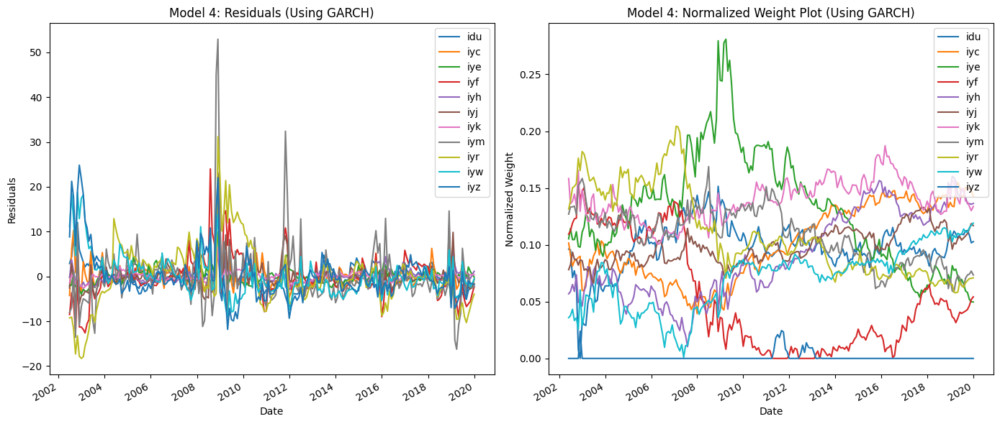

In [77]:
# Plot residuals and weights (Using GARCH)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# Plot ETFs residuals on the first subplot
garch_residuals_4.plot(kind='line', ax=ax1, title='Model 4: Residuals (Using GARCH)')
ax1.set_xlabel('Date')
ax1.set_ylabel('Residuals')

# Plot ETFs weights on the second subplot
garch_normal_weight_4.plot(kind='line', ax=ax2, title='Model 4: Normalized Weight Plot (Using GARCH)')
ax2.set_xlabel('Date')
ax2.set_ylabel('Normalized Weight')

fig.tight_layout()
plt.show()

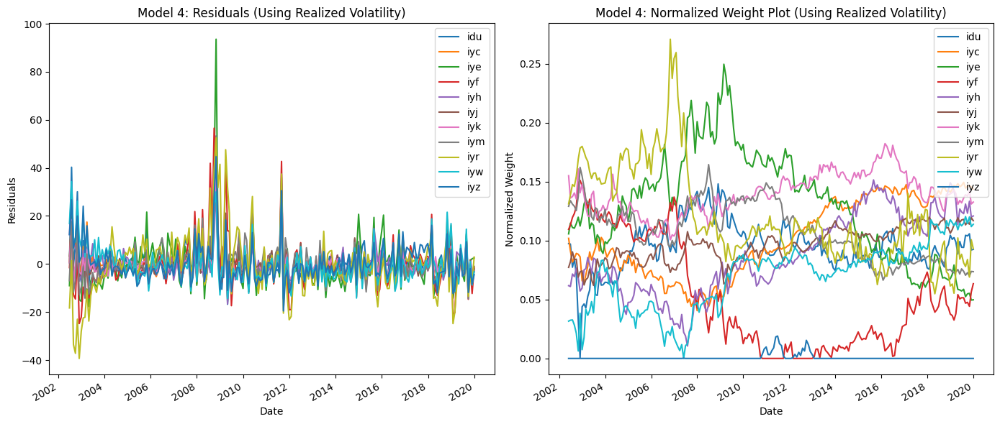

In [78]:
# Plot residuals and weights (Using GARCH)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# Plot ETFs residuals on the first subplot
rv_residuals_4.plot(kind='line', ax=ax1, title='Model 4: Residuals (Using Realized Volatility)')
ax1.set_xlabel('Date')
ax1.set_ylabel('Residuals')

# Plot ETFs weights on the second subplot
rv_normal_weight_4.plot(kind='line', ax=ax2, title='Model 4: Normalized Weight Plot (Using Realized Volatility)')
ax2.set_xlabel('Date')
ax2.set_ylabel('Normalized Weight')

fig.tight_layout()
plt.show()

Compare the Sharpe ratio, Information ratio, CER, turnover, and CRRA of the following portfolios:
*   Value weighted portfolio (IVV ETF)
*   Equal weighted portfolio
*   Constant volatility portfolio
*   GARCH portfolio
*   Realized volatility portfolio

In [79]:
# Calculate garch portfolio return
garch_portfolio_return_4 = garch_normal_weight_4.shift(1) * monthly_train.drop('ivv', axis = 1)
garch_portfolio_return_4['portfolio'] = garch_portfolio_return_4.sum(axis = 1)

print('GARCH portfolio returns:')
print(tabulate(garch_portfolio_return_4.head().round(4), headers='keys', tablefmt='pretty'))

# Calculate realized volatility portfolio return
rv_portfolio_return_4 = rv_normal_weight_4.shift(1) * monthly_train.drop('ivv', axis = 1)
rv_portfolio_return_4['portfolio'] = rv_portfolio_return_4.sum(axis = 1)

print('Realized volatility portfolio returns:')
print(tabulate(rv_portfolio_return_4.head().round(4), headers='keys', tablefmt='pretty'))

GARCH portfolio returns:
+---------------------+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----------+
|        date         | idu | iyc | iye | iyf | iyh | iyj | iyk | iym | iyr | iyw | iyz | portfolio |
+---------------------+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----------+
| 2002-01-31 00:00:00 | nan | nan | nan | nan | nan | nan | nan | nan | nan | nan | nan |    0.0    |
| 2002-02-28 00:00:00 | nan | nan | nan | nan | nan | nan | nan | nan | nan | nan | nan |    0.0    |
| 2002-03-28 00:00:00 | nan | nan | nan | nan | nan | nan | nan | nan | nan | nan | nan |    0.0    |
| 2002-04-30 00:00:00 | nan | nan | nan | nan | nan | nan | nan | nan | nan | nan | nan |    0.0    |
| 2002-05-31 00:00:00 | nan | nan | nan | nan | nan | nan | nan | nan | nan | nan | nan |    0.0    |
+---------------------+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----------+
Realized volatility portfolio returns:
+-----------------

In [80]:
# Create a new dataframe to store the return of portfolios
portfolios_return_df_4 = pd.DataFrame({'vw':monthly_train['ivv'],
                                       'ew':ew_portfolio_return['portfolio'],
                                       'cv':cv_portfolio_return['portfolio'],
                                       'garch':garch_portfolio_return_4['portfolio'],
                                       'rv':rv_portfolio_return_4['portfolio']})

# Calculate the total return of all portfolios
print(f"Value-weighted portfolio total return: {portfolios_return_df_4.loc['2002-04-30':,'vw'].sum().round(2)}")
print(f"Equal-weighted portfolio total return: {portfolios_return_df_4.loc['2002-04-30':,'ew'].sum().round(2)}")
print(f"Constant Volatility portfolio total return: {portfolios_return_df_4.loc['2002-04-30':,'cv'].sum().round(2)}")
print(f"GARCH portfolio total return: {portfolios_return_df_4.loc['2002-04-30':,'garch'].sum().round(2)}")
print(f"Realized Volatility portfolio total return: {portfolios_return_df_4.loc['2002-04-30':,'rv'].sum().round(2)}")

Value-weighted portfolio total return: 103.79
Equal-weighted portfolio total return: 93.09
Constant Volatility portfolio total return: 94.73
GARCH portfolio total return: 98.62
Realized Volatility portfolio total return: 97.74


In [81]:
riskfree_subset_4 = riskfree_df.loc[portfolios_return_df_4.index.min():portfolios_return_df_4.index.max()]

# Calculate the Sharpe ratio of portfolios
sr_df_4 = portfolios_return_df_4.sub(riskfree_subset_4['riskfree'] / 12, axis = 0)

print(f"Value-weighted portfolio annual Sharpe ratio = {round(sr_df_3['vw'].mean()/portfolios_return_df_4['vw'].std() * np.sqrt(12), 4)}")
print(f"Equal-weighted portfolio annual Sharpe ratio = {round(sr_df_3['ew'].mean()/portfolios_return_df_4['ew'].std() * np.sqrt(12), 4)}")
print(f"Constant Volatility portfolio annual Sharpe ratio = {round(sr_df_3['cv'].mean()/portfolios_return_df_4['cv'].std() * np.sqrt(12), 4)}")
print(f"GARCH portfolio annual Sharpe ratio = {round(sr_df_3['garch'].mean()/portfolios_return_df_4['garch'].std() * np.sqrt(12), 4)}")
print(f"Realized Volatility portfolio annual Sharpe ratio = {round(sr_df_3['rv'].mean()/portfolios_return_df_4['rv'].std() * np.sqrt(12), 4)}")

print()
# Calculate the information ratio of portfolios
ir_df_4 = portfolios_return_df_4.sub(monthly_train['ivv'], axis = 0)

print(f"Value-weighted portfolio annual information ratio = {round(ir_df_4['vw'].mean()/ir_df_4['vw'].std() * np.sqrt(12), 4)}")
print(f"Equal-weighted portfolio annual information ratio = {round(ir_df_4['ew'].mean()/ir_df_4['ew'].std() * np.sqrt(12), 4)}")
print(f"Constant Volatility portfolio annual information ratio = {round(ir_df_4['cv'].mean()/ir_df_4['cv'].std() * np.sqrt(12), 4)}")
print(f"GARCH portfolio annual information ratio = {round(ir_df_4['garch'].mean()/ir_df_4['garch'].std() * np.sqrt(12), 4)}")
print(f"Realized Volatility portfolio annual information ratio = {round(ir_df_4['rv'].mean()/ir_df_4['rv'].std() * np.sqrt(12), 4)}")

print()
#Calculate the certainty equivalent return (CER) of portfolios
risk_aversion_coeff = 5

print(f"Value-weighted portfolio annual certainty equivalent return (CER) = {round((portfolios_return_df_4['vw'].mean() - 0.5 * risk_aversion_coeff * portfolios_return_df_4['vw'].var()/100) * 12 / 100, 4)}")
print(f"Equal-weighted portfolio annual certainty equivalent return (CER) = {round((portfolios_return_df_4['ew'].mean() - 0.5 * risk_aversion_coeff * portfolios_return_df_4['ew'].var()/100) * 12 / 100, 4)}")
print(f"Constant Volatility portfolio annual certainty equivalent return (CER) = {round((portfolios_return_df_4['cv'].mean() - 0.5 * risk_aversion_coeff * portfolios_return_df_4['cv'].var()/100) * 12 / 100, 4)}")
print(f"GARCH portfolio annual certainty equivalent return (CER) = {round((portfolios_return_df_4['garch'].mean() - 0.5 * risk_aversion_coeff * portfolios_return_df_4['garch'].var()/100) * 12 / 100, 4)}")
print(f"Realized Volatility portfolio annual certainty equivalent return (CER) = {round((portfolios_return_df_4['rv'].mean() - 0.5 * risk_aversion_coeff * portfolios_return_df_4['rv'].var()/100) * 12 / 100, 4)}")

Value-weighted portfolio annual Sharpe ratio = 0.3165
Equal-weighted portfolio annual Sharpe ratio = 0.27
Constant Volatility portfolio annual Sharpe ratio = 0.2942
GARCH portfolio annual Sharpe ratio = 0.2925
Realized Volatility portfolio annual Sharpe ratio = 0.2844

Value-weighted portfolio annual information ratio = nan
Equal-weighted portfolio annual information ratio = -0.2016
Constant Volatility portfolio annual information ratio = -0.0639
GARCH portfolio annual information ratio = -0.0759
Realized Volatility portfolio annual information ratio = -0.086

Value-weighted portfolio annual certainty equivalent return (CER) = 0.008
Equal-weighted portfolio annual certainty equivalent return (CER) = -0.0003
Constant Volatility portfolio annual certainty equivalent return (CER) = 0.004
GARCH portfolio annual certainty equivalent return (CER) = 0.0045
Realized Volatility portfolio annual certainty equivalent return (CER) = 0.0037


In [82]:
# Calculate GARCH portfolio turnover
garch_turnover_df_4 = garch_normal_weight_4.shift(1) * np.exp(monthly_train.drop('ivv', axis = 1) / 100)

numerator = garch_turnover_df_4.sub(garch_turnover_df_4.min(axis = 1), axis = 0)
denominator = garch_turnover_df_4.max(axis = 1) - garch_turnover_df_4.min(axis = 1)
garch_turnover_df_4 = numerator.div(denominator, axis = 0)
garch_turnover_df_4 = garch_turnover_df_4.div(garch_turnover_df_4.sum(axis = 1), axis=0)

garch_turnover_df_4 = garch_turnover_df_4 - garch_normal_weight_4.shift(1)
garch_turnover_df_4['turnover'] = garch_turnover_df_4.abs().sum(axis = 1) / 2

# Calculate realized volatility portfolio turnover
rv_turnover_df_4 = rv_normal_weight_4.shift(1) * np.exp(monthly_train.drop('ivv', axis = 1) / 100)

numerator = rv_turnover_df_4.sub(rv_turnover_df_4.min(axis = 1), axis = 0)
denominator = rv_turnover_df_4.max(axis = 1) - rv_turnover_df_4.min(axis = 1)
rv_turnover_df_4 = numerator.div(denominator, axis = 0)
rv_turnover_df_4 = rv_turnover_df_4.div(rv_turnover_df_4.sum(axis = 1), axis=0)

rv_turnover_df_4 = rv_turnover_df_4 - rv_normal_weight_4.shift(1)
rv_turnover_df_4['turnover'] = rv_turnover_df_4.abs().sum(axis = 1) / 2

# Create a new dataframe to store the turnover of portfolios
turnover_df_4 = pd.DataFrame({'ew':ew_turnover_df['turnover'],
                            'cv':cv_turnover_df['turnover'],
                            'garch':garch_turnover_df_4['turnover'],
                            'rv':rv_turnover_df_4['turnover'],
                            })

print(f"Equal-weighted portfolio average annual turnover: {round(turnover_df_4['ew'].mean() * 12, 4)}")
print(f"Constant volatility portfolio average annual turnover: {round(turnover_df_4['cv'].mean() * 12, 4)}")
print(f"GARCH portfolio average annual turnover: {round(turnover_df_4['garch'].mean() * 12, 4)}")
print(f"Realized volatility portfolio average annual turnover: {round(turnover_df_4['rv'].mean() * 12, 4)}")

Equal-weighted portfolio average annual turnover: 2.9824
Constant volatility portfolio average annual turnover: 0.1365
GARCH portfolio average annual turnover: 0.1323
Realized volatility portfolio average annual turnover: 0.1329


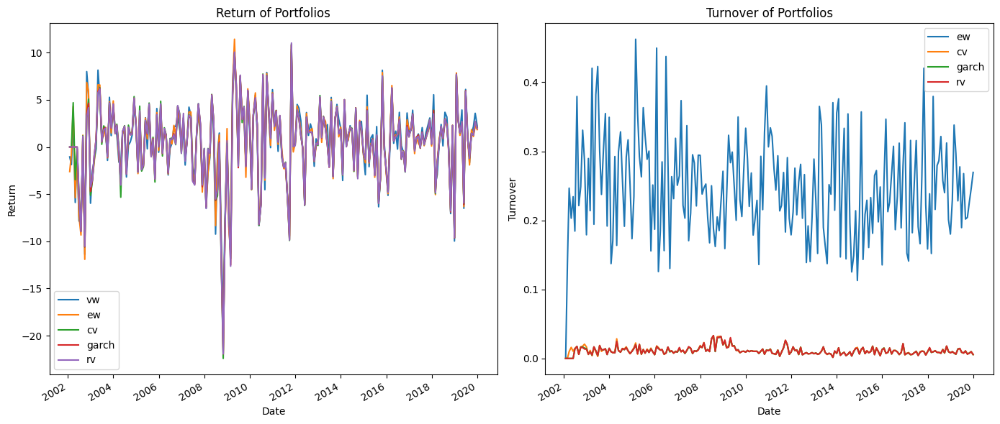

In [83]:
# Plot the returns and turnovers of portfolios
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (14, 6))

# Plot the return of portfolios on the first subplot
portfolios_return_df_4.plot(kind='line', ax = ax1, title = 'Return of Portfolios')
ax1.set_xlabel('Date')
ax1.set_ylabel('Return')

# Plot the turnover of portfolios on the second subplot
turnover_df_4.plot(kind='line', ax = ax2, title = 'Turnover of Portfolios')
ax2.set_xlabel('Date')
ax2.set_ylabel('Turnover')

fig.tight_layout()
plt.show()

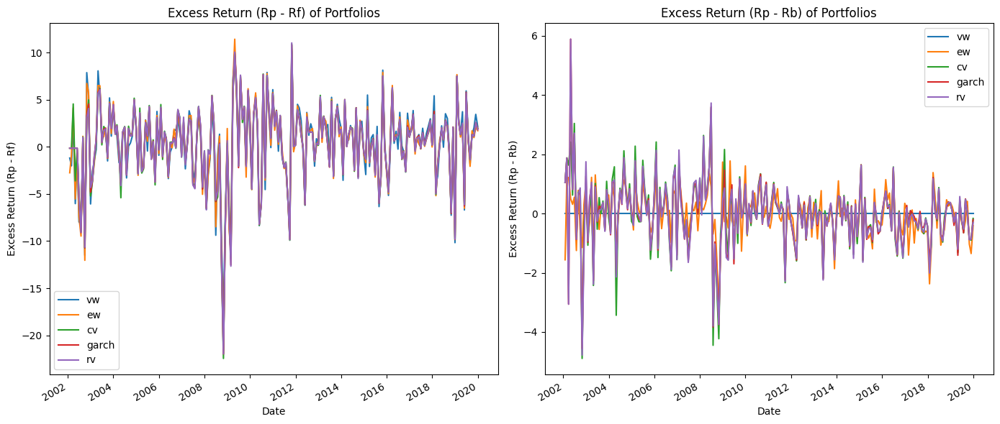

In [84]:
# Plot the excess returns of portfolios
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (14, 6))

# Plot the excess return (Rp - Rf) of portfolios on the first subplot
sr_df_4.plot(kind='line', ax = ax1, title = 'Excess Return (Rp - Rf) of Portfolios')
ax1.set_xlabel('Date')
ax1.set_ylabel('Excess Return (Rp - Rf)')

# Plot the excess return (Rp - Rb) of portfolios on the second subplot
ir_df_4.plot(kind='line', ax = ax2, title = 'Excess Return (Rp - Rb) of Portfolios')
ax2.set_xlabel('Date')
ax2.set_ylabel('Excess Return (Rp - Rb)')

fig.tight_layout()
plt.show()

2006-2020 Normalized and Non-normalized weights

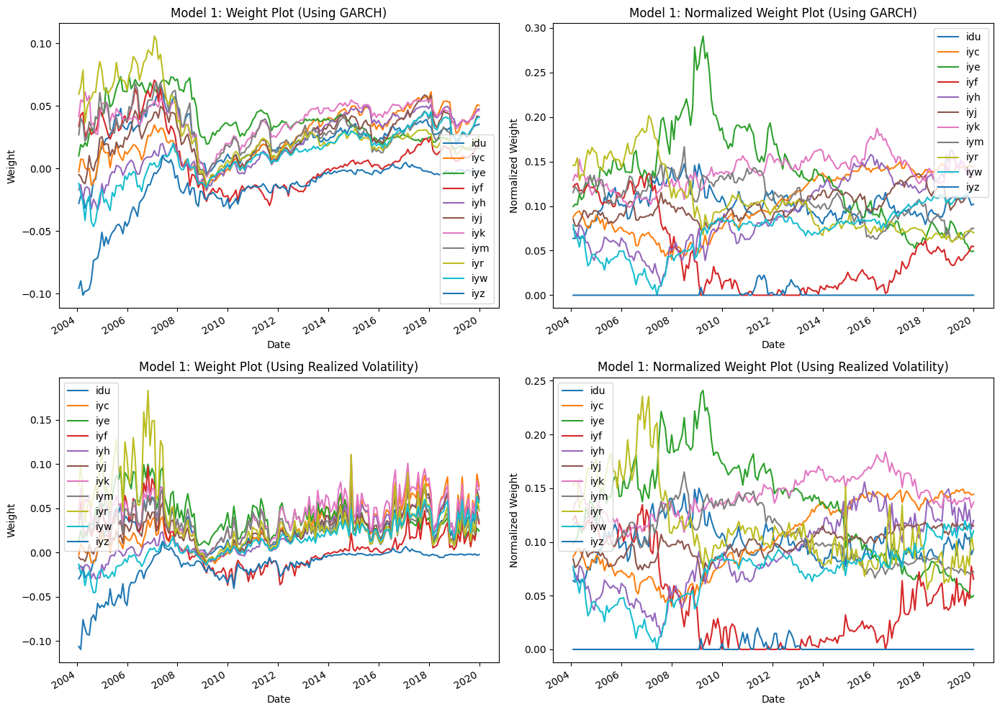

In [85]:
# Plot normalized and non-normalized weights
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(14, 10))

# Plot ETFs non-normalized on the first subplot
garch_weight[24:].plot(kind='line', ax=ax1, title='Model 1: Weight Plot (Using GARCH)')
ax1.set_xlabel('Date')
ax1.set_ylabel('Weight')

# Plot ETFs normalized weights on the second subplot
garch_normal_weight[24:].plot(kind='line', ax=ax2, title='Model 1: Normalized Weight Plot (Using GARCH)')
ax2.set_xlabel('Date')
ax2.set_ylabel('Normalized Weight')

# Plot ETFs non-normalized on the first subplot
rv_weight[24:].plot(kind='line', ax=ax3, title='Model 1: Weight Plot (Using Realized Volatility)')
ax3.set_xlabel('Date')
ax3.set_ylabel('Weight')

# Plot ETFs normalized weights on the second subplot
rv_normal_weight[24:].plot(kind='line', ax=ax4, title='Model 1: Normalized Weight Plot (Using Realized Volatility)')
ax4.set_xlabel('Date')
ax4.set_ylabel('Normalized Weight')

fig.tight_layout()
plt.show()

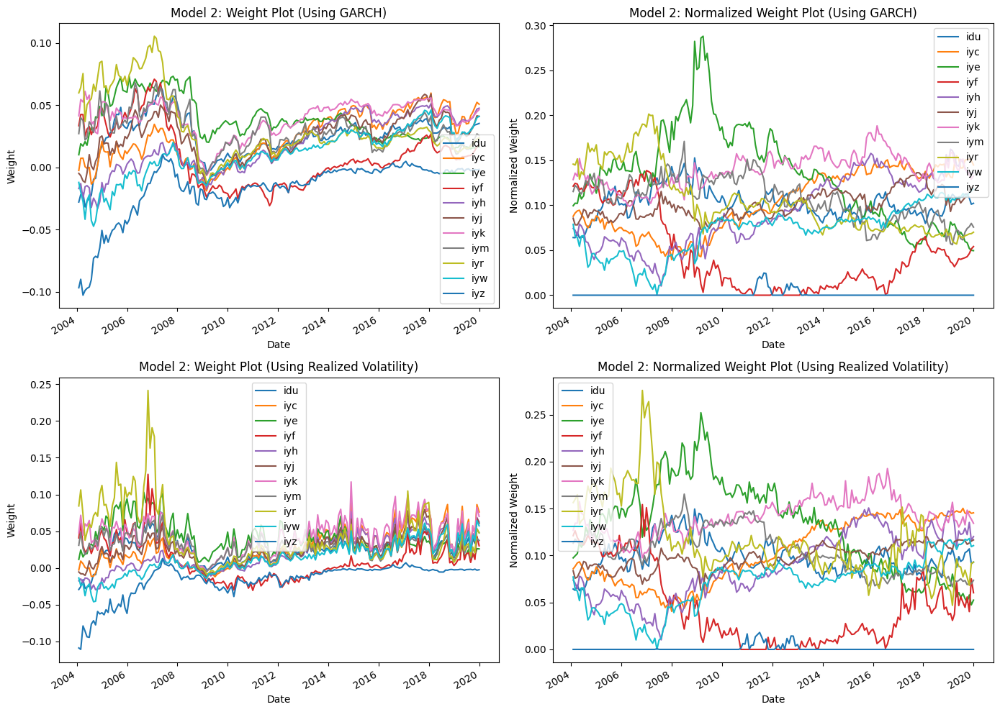

In [86]:
# Plot normalized and non-normalized weights
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(14, 10))

# Plot ETFs non-normalized on the first subplot
garch_weight_2[24:].plot(kind='line', ax=ax1, title='Model 2: Weight Plot (Using GARCH)')
ax1.set_xlabel('Date')
ax1.set_ylabel('Weight')

# Plot ETFs normalized weights on the second subplot
garch_normal_weight_2[24:].plot(kind='line', ax=ax2, title='Model 2: Normalized Weight Plot (Using GARCH)')
ax2.set_xlabel('Date')
ax2.set_ylabel('Normalized Weight')

# Plot ETFs non-normalized on the first subplot
rv_weight_2[24:].plot(kind='line', ax=ax3, title='Model 2: Weight Plot (Using Realized Volatility)')
ax3.set_xlabel('Date')
ax3.set_ylabel('Weight')

# Plot ETFs normalized weights on the second subplot
rv_normal_weight_2[24:].plot(kind='line', ax=ax4, title='Model 2: Normalized Weight Plot (Using Realized Volatility)')
ax4.set_xlabel('Date')
ax4.set_ylabel('Normalized Weight')

fig.tight_layout()
plt.show()

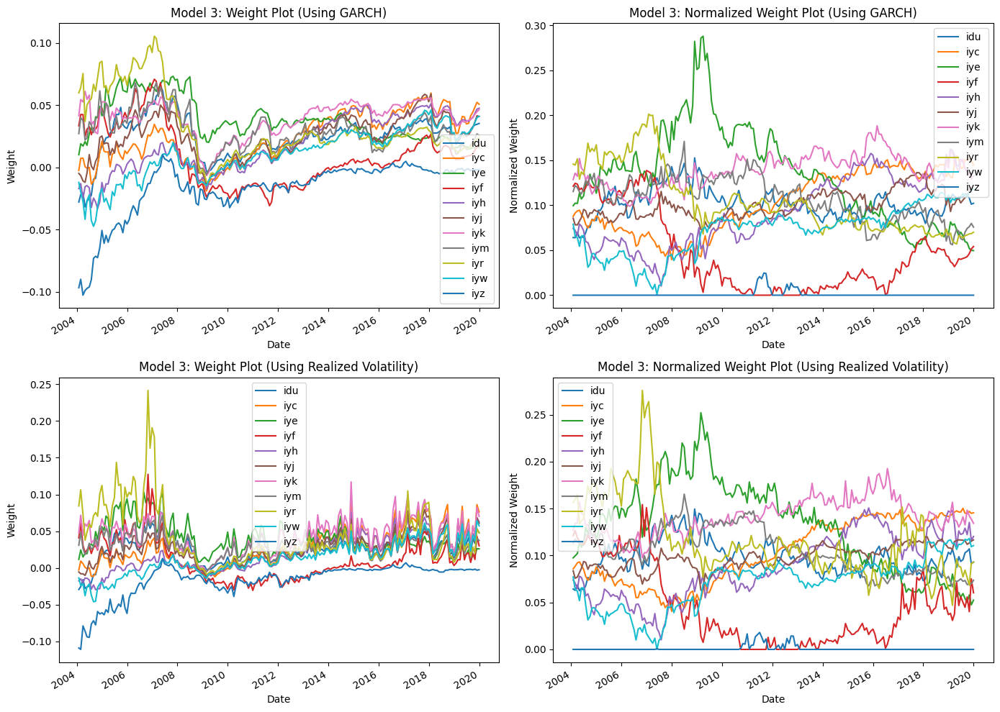

In [87]:
# Plot normalized and non-normalized weights
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(14, 10))

# Plot ETFs non-normalized on the first subplot
garch_weight_3[24:].plot(kind='line', ax=ax1, title='Model 3: Weight Plot (Using GARCH)')
ax1.set_xlabel('Date')
ax1.set_ylabel('Weight')

# Plot ETFs normalized weights on the second subplot
garch_normal_weight_3[24:].plot(kind='line', ax=ax2, title='Model 3: Normalized Weight Plot (Using GARCH)')
ax2.set_xlabel('Date')
ax2.set_ylabel('Normalized Weight')

# Plot ETFs non-normalized on the first subplot
rv_weight_3[24:].plot(kind='line', ax=ax3, title='Model 3: Weight Plot (Using Realized Volatility)')
ax3.set_xlabel('Date')
ax3.set_ylabel('Weight')

# Plot ETFs normalized weights on the second subplot
rv_normal_weight_3[24:].plot(kind='line', ax=ax4, title='Model 3: Normalized Weight Plot (Using Realized Volatility)')
ax4.set_xlabel('Date')
ax4.set_ylabel('Normalized Weight')

fig.tight_layout()
plt.show()

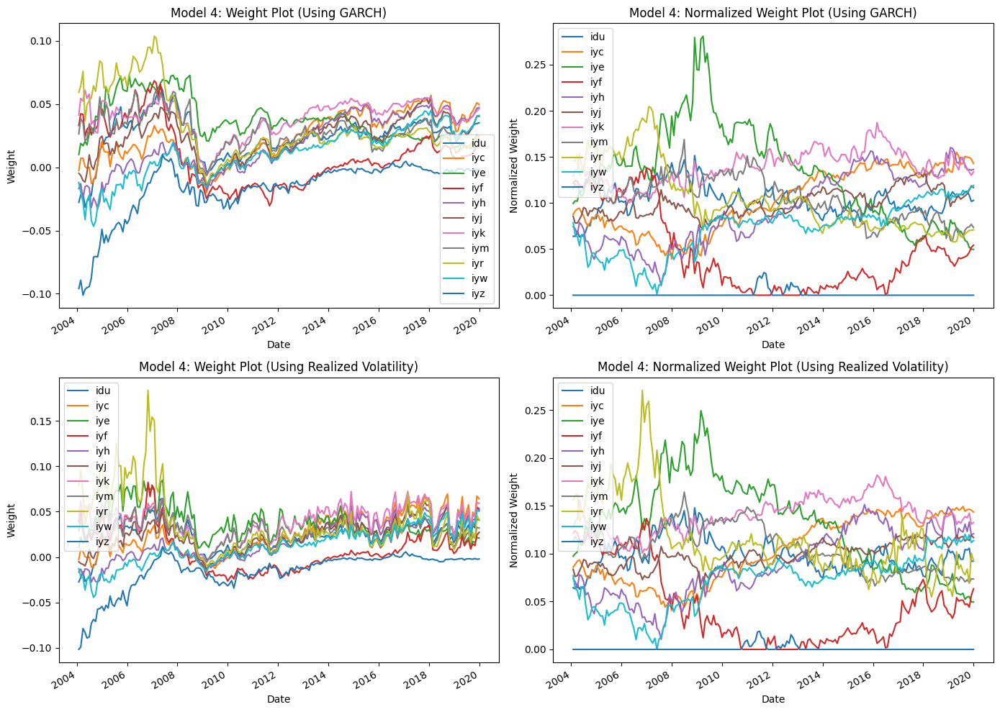

In [88]:
# Plot normalized and non-normalized weights
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(14, 10))

# Plot ETFs non-normalized on the first subplot
garch_weight_4[24:].plot(kind='line', ax=ax1, title='Model 4: Weight Plot (Using GARCH)')
ax1.set_xlabel('Date')
ax1.set_ylabel('Weight')

# Plot ETFs normalized weights on the second subplot
garch_normal_weight_4[24:].plot(kind='line', ax=ax2, title='Model 4: Normalized Weight Plot (Using GARCH)')
ax2.set_xlabel('Date')
ax2.set_ylabel('Normalized Weight')

# Plot ETFs non-normalized on the first subplot
rv_weight_4[24:].plot(kind='line', ax=ax3, title='Model 4: Weight Plot (Using Realized Volatility)')
ax3.set_xlabel('Date')
ax3.set_ylabel('Weight')

# Plot ETFs normalized weights on the second subplot
rv_normal_weight_4[24:].plot(kind='line', ax=ax4, title='Model 4: Normalized Weight Plot (Using Realized Volatility)')
ax4.set_xlabel('Date')
ax4.set_ylabel('Normalized Weight')

fig.tight_layout()
plt.show()